##  **Mango Leaf Disease Classification using MobileNetV2**
In this notebook, we implement an end-to-end deep learning solution for multi-class classification of mango leaf diseases using the MobileNetV2 pre-trained model. This project aims to assist farmers in accurately identifying diseases in mango leaves, enabling timely and effective treatment with appropriate pesticides.

By leveraging transfer learning with MobileNetV2, a lightweight yet powerful model architecture, we achieve high classification accuracy even with limited computational resources. The project covers every step of the model development pipeline, including data preprocessing, augmentation, model fine-tuning, and evaluation, resulting in a robust tool for disease detection in agricultural settings.

**Project Highlights:**

**1. Purpose:** To aid farmers in identifying mango leaf diseases for improved crop health and yield.

**2. Model:** MobileNetV2, known for its efficiency and suitability for deployment on mobile and edge devices.

**3. Goal:** High accuracy and lightweight deployment for practical use in real-world agricultural applications.

This notebook will walk through each stage of the project, from data preparation to model evaluation, offering a comprehensive approach to building an effective image classification model for disease detection.


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import pandas as pd
train_csv = pd.read_csv(r'/content/drive/MyDrive/mango leaf/train_labels.csv')
train_csv.head()

,id,disease
0,20211129_162005 (Custom).jpg,Die Back
1,IMG_20211011_153126 (Custom).jpg,Anthracnose
2,IMG_20211011_153447 (Custom).jpg,Anthracnose
3,20211129_160816 (Custom).jpg,Die Back
4,IMG_20211108_122730 (Custom).jpg,Sooty Mould


In [3]:
test_csv = pd.read_csv(r'/content/drive/MyDrive/mango leaf/test_labels.csv')
test_csv.head()

,id,disease
0,20211011_170726 (Custom).jpg,Anthracnose
1,IMG_20211011_140433 (Custom).jpg,Anthracnose
2,20211109_121741 (Custom).jpg,Powdery Mildew
3,IMG_20211011_164850 (Custom).jpg,Anthracnose
4,20211109_121729 (Custom).jpg,Powdery Mildew


### lets get the folder name of first image in test_data folder



## Lets check first image id of test_data folder.


In [4]:
import os

# Define the path to the test_data folder
test_data_folder = '/content/drive/MyDrive/mango leaf/test_data'

# Get a list of all files in the folder
image_files = [
    f for f in os.listdir(test_data_folder)
    if os.path.isfile(os.path.join(test_data_folder, f))
]

# Get the first image file (if any)
first_image = image_files[0] if image_files else None

# Print the filename of the first image
if first_image:
    print(f"First image in test_data folder: {first_image}")
else:
    print("No images found in test_data folder.")

First image in test_data folder: 20211011_170726 (Custom).jpg


### Lets get the first image id and label of test_labels csv file

In [5]:
test_csv = pd.read_csv(r'/content/drive/MyDrive/mango leaf/test_labels.csv')
test_csv.iloc[0]

,0
id,20211011_170726 (Custom).jpg
disease,Anthracnose


### lets check if there is any mismatch in test data folder and test_labels csv

In [6]:
import os
import pandas as pd

# Define paths
test_data_folder = '/content/drive/MyDrive/mango leaf/test_data'
test_labels_csv = '/content/drive/MyDrive/mango leaf/test_labels.csv'

# Load the test_labels.csv file
test_df = pd.read_csv(test_labels_csv)

# Get a list of image IDs from the CSV file
csv_image_ids = test_df['id'].tolist()

# Get a list of image filenames from the train_data folder
image_filenames = [
    f for f in os.listdir(test_data_folder)
    if os.path.isfile(os.path.join(test_data_folder, f))
]

# Check if the image IDs and filenames match in order
if csv_image_ids == image_filenames:
    print("Image IDs in test_labels.csv and test_data folder match in order.")
else:
    print("Mismatch found between image IDs in test_labels.csv and test_data folder.")

    # Optionally, print the mismatched IDs
    mismatched_ids = [
        (csv_id, img_filename)
        for csv_id, img_filename in zip(csv_image_ids, image_filenames)
        if csv_id != img_filename
    ]
    if mismatched_ids:
        print("Mismatched IDs:")
        for csv_id, img_filename in mismatched_ids:
            print(f"CSV ID: {csv_id}, Image filename: {img_filename}")

Image IDs in test_labels.csv and test_data folder match in order.


### Lets check the first image of test_data folder

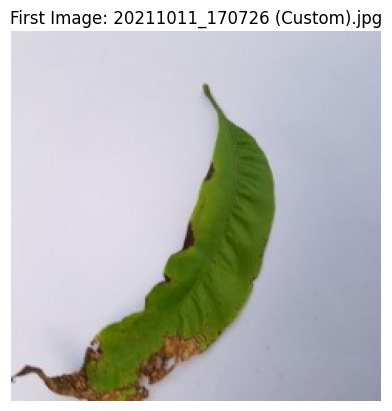

In [7]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the path to the test_data folder
test_data_folder = '/content/drive/MyDrive/mango leaf/test_data'

# Get a list of image files in the folder
image_files = [
    f for f in os.listdir(test_data_folder)
    if os.path.isfile(os.path.join(test_data_folder, f))
]

# Get the first image file (if any)
first_image_file = image_files[0] if image_files else None

# Display the first image
if first_image_file:
    image_path = os.path.join(test_data_folder, first_image_file)
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f"First Image: {first_image_file}")
    plt.axis('off')  # Hide axis ticks and labels
    plt.show()
else:
    print("No images found in test_data folder.")

### Lets check the first image test_labels csv file.

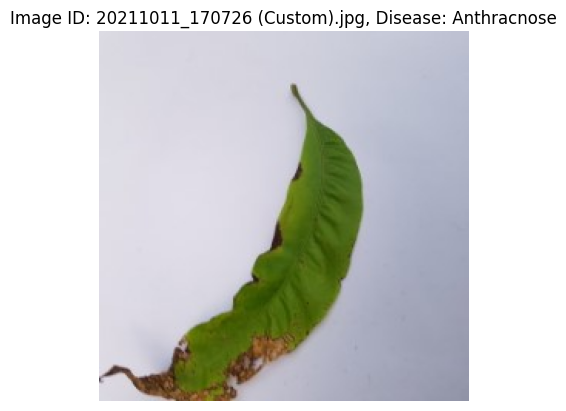

In [8]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Define paths
test_data_folder = '/content/drive/MyDrive/mango leaf/test_data'
tset_labels_csv = '/content/drive/MyDrive/mango leaf/test_labels.csv'

# Load the test_labels.csv file
test_df = pd.read_csv(test_labels_csv)

# Get the first row (information about the first image)
first_image_info = test_df.iloc[0]

# Extract the image ID and disease label
image_id = first_image_info['id']
disease_label = first_image_info['disease']

# Construct the image path
image_path = os.path.join(test_data_folder, image_id)

# Display the image
if os.path.exists(image_path):
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f"Image ID: {image_id}, Disease: {disease_label}")
    plt.axis('off')
    plt.show()
else:
    print(f"Image file not found: {image_path}")

### Lets check the first image id of train_data id .

In [9]:
import os

# Define the path to the train_data folder
train_data_folder = '/content/drive/MyDrive/mango leaf/train_data'

# Get a list of all files in the folder
image_files = [
    f for f in os.listdir(train_data_folder)
    if os.path.isfile(os.path.join(train_data_folder, f))
]

# Get the first image file (if any)
first_image = image_files[0] if image_files else None

# Print the filename of the first image
if first_image:
    print(f"First image in train_data folder: {first_image}")
else:
    print("No images found in train_data folder.")

First image in train_data folder: 20211129_164457 (Custom).jpg


### Lets check the id of the first image in the train_labels csv file.

In [10]:
train_csv = pd.read_csv(r'/content/drive/MyDrive/mango leaf/train_labels.csv')
train_csv.iloc[0]

,0
id,20211129_162005 (Custom).jpg
disease,Die Back


### Lets check if there is any mismatch between the train_data and train_labels.csv filders id.s of images

In [11]:
import os
import pandas as pd

# Define paths
train_data_folder = '/content/drive/MyDrive/mango leaf/train_data'
train_labels_csv = '/content/drive/MyDrive/mango leaf/train_labels.csv'

# Load the train_labels.csv file
train_df = pd.read_csv(train_labels_csv)

# Get a list of image IDs from the CSV file
csv_image_ids = train_df['id'].tolist()

# Get a list of image filenames from the train_data folder
image_filenames = [
    f for f in os.listdir(train_data_folder)
    if os.path.isfile(os.path.join(train_data_folder, f))
]

# Check if the image IDs and filenames match in order
if csv_image_ids == image_filenames:
    print("Image IDs in train_labels.csv and train_data folder match in order.")
else:
    print("Mismatch found between image IDs in train_labels.csv and train_data folder.")

    # Optionally, print the mismatched IDs
    mismatched_ids = [
        (csv_id, img_filename)
        for csv_id, img_filename in zip(csv_image_ids, image_filenames)
        if csv_id != img_filename
    ]
    if mismatched_ids:
        print("Mismatched IDs:")
        for csv_id, img_filename in mismatched_ids:
            print(f"CSV ID: {csv_id}, Image filename: {img_filename}")

Mismatch found between image IDs in train_labels.csv and train_data folder.
Mismatched IDs:
CSV ID: 20211129_162005 (Custom).jpg, Image filename: 20211129_164457 (Custom).jpg
CSV ID: IMG_20211011_153126 (Custom).jpg, Image filename: 20211011_161502 (Custom).jpg
CSV ID: IMG_20211011_153447 (Custom).jpg, Image filename: IMG_20211211_154931 (Custom).jpg
CSV ID: 20211129_160816 (Custom).jpg, Image filename: IMG_20211106_163908 (Custom).jpg
CSV ID: IMG_20211108_122730 (Custom).jpg, Image filename: IMG_20211106_163126 (Custom).jpg
CSV ID: 20211129_160917 (Custom).jpg, Image filename: IMG_20211106_143047 (Custom).jpg
CSV ID: IMG_20211108_121329 (Custom).jpg, Image filename: IMG_20211106_162146 (Custom).jpg
CSV ID: IMG_20211108_120922 (Custom).jpg, Image filename: 20211011_161828 (Custom) (Custom).jpg
CSV ID: IMG_20211106_170145 (Custom).jpg, Image filename: IMG_20211106_135142 (Custom).jpg
CSV ID: IMG_20211106_161437 (Custom).jpg, Image filename: IMG_20211107_123135 (Custom).jpg
CSV ID: IMG_2

### Lets check the first image of train_data folder

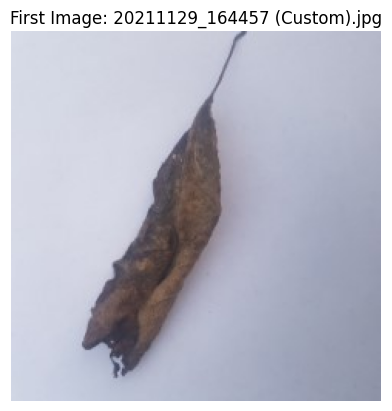

In [12]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the path to the train_data folder
train_data_folder = '/content/drive/MyDrive/mango leaf/train_data'

# Get a list of image files in the folder
image_files = [
    f for f in os.listdir(train_data_folder)
    if os.path.isfile(os.path.join(train_data_folder, f))
]

# Get the first image file (if any)
first_image_file = image_files[0] if image_files else None

# Display the first image
if first_image_file:
    image_path = os.path.join(train_data_folder, first_image_file)
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f"First Image: {first_image_file}")
    plt.axis('off')  # Hide axis ticks and labels
    plt.show()
else:
    print("No images found in train_data folder.")

### Lets check first image of train_labels csv file

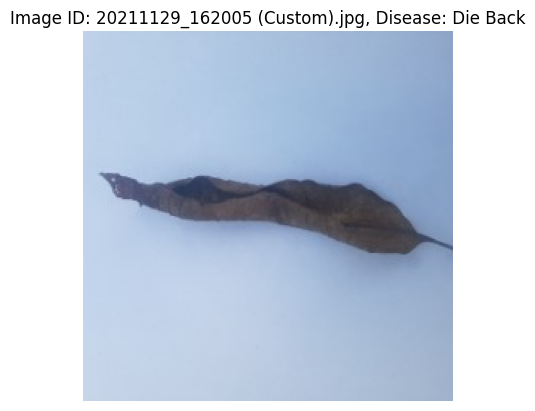

In [13]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Define paths
train_data_folder = '/content/drive/MyDrive/mango leaf/train_data'
train_labels_csv = '/content/drive/MyDrive/mango leaf/train_labels.csv'

# Load the train_labels.csv file
train_df = pd.read_csv(train_labels_csv)

# Get the first row (information about the first image)
first_image_info = train_df.iloc[0]

# Extract the image ID and disease label
image_id = first_image_info['id']
disease_label = first_image_info['disease']

# Construct the image path
image_path = os.path.join(train_data_folder, image_id)

# Display the image
if os.path.exists(image_path):
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f"Image ID: {image_id}, Disease: {disease_label}")
    plt.axis('off')
    plt.show()
else:
    print(f"Image file not found: {image_path}")

In [14]:
train_csv

,id,disease
0,20211129_162005 (Custom).jpg,Die Back
1,IMG_20211011_153126 (Custom).jpg,Anthracnose
2,IMG_20211011_153447 (Custom).jpg,Anthracnose
3,20211129_160816 (Custom).jpg,Die Back
4,IMG_20211108_122730 (Custom).jpg,Sooty Mould
...,...,...
3195,20211011_161924 (Custom).jpg,Cutting Weevil
3196,20211011_170533 (Custom).jpg,Cutting Weevil
3197,IMG_20211211_154856 (Custom).jpg,Sooty Mould
3198,IMG_20211108_123437 (Custom).jpg,Sooty Mould


In [15]:
test_csv

,id,disease
0,20211011_170726 (Custom).jpg,Anthracnose
1,IMG_20211011_140433 (Custom).jpg,Anthracnose
2,20211109_121741 (Custom).jpg,Powdery Mildew
3,IMG_20211011_164850 (Custom).jpg,Anthracnose
4,20211109_121729 (Custom).jpg,Powdery Mildew
...,...,...
795,20211109_121245 (Custom).jpg,Powdery Mildew
796,IMG_20211108_120816 (Custom).jpg,Sooty Mould
797,IMG_20211106_164000 (Custom).jpg,Gall Midge
798,20211109_121301 (Custom).jpg,Powdery Mildew


### Lets import TensorFlow to our Colab work space.

In [16]:
import tensorflow as tf

In [17]:
print(tf.__version__)

2.17.0


In [18]:
train_labels=train_csv

In [19]:
train_labels.head()

,id,disease
0,20211129_162005 (Custom).jpg,Die Back
1,IMG_20211011_153126 (Custom).jpg,Anthracnose
2,IMG_20211011_153447 (Custom).jpg,Anthracnose
3,20211129_160816 (Custom).jpg,Die Back
4,IMG_20211108_122730 (Custom).jpg,Sooty Mould


In [20]:
train_labels.describe()

,id,disease
count,3200,3200
unique,3200,8
top,IMG_20211106_142816 (Custom).jpg,Gall Midge
freq,1,415


In [21]:
# lets check the unique diseases  count in our train_labels csv file
train_labels['disease'].value_counts().reset_index()

,disease,count
0,Gall Midge,415
1,Die Back,411
2,Bacterial Canker,405
3,Anthracnose,403
4,Cutting Weevil,397
5,Powdery Mildew,393
6,Healthy,392
7,Sooty Mould,384


## lets visuallly check the value count of each disease

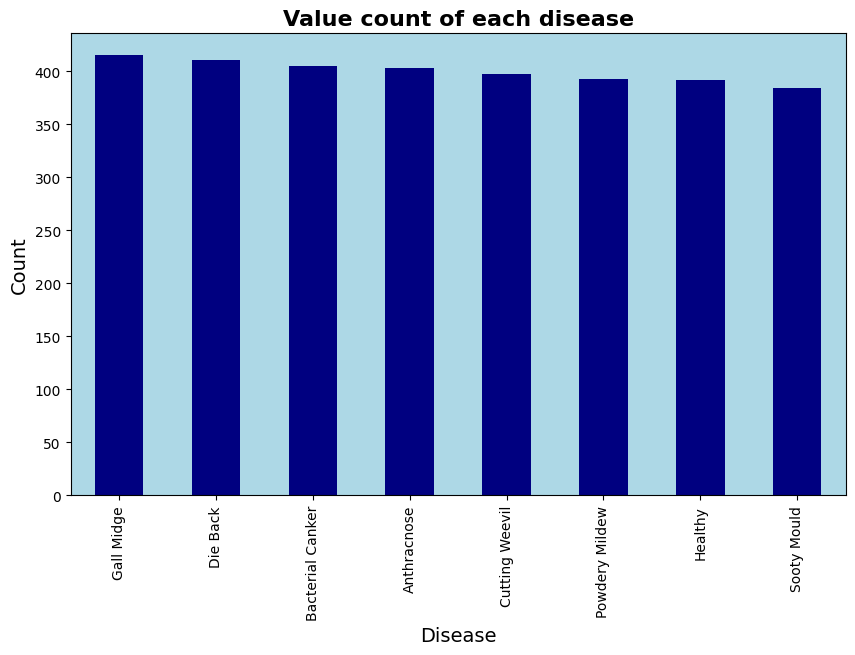

In [22]:
import matplotlib.pyplot as plt
train_labels['disease'].value_counts().plot(kind="bar", figsize=(10,6), color="navy")
plt.gca().set_facecolor("lightblue")
plt.title("Value count of each disease", fontsize=16, fontweight='bold', color='Black')
plt.xlabel("Disease", fontsize=14, fontweight='medium', color='Black')
plt.ylabel("Count", fontsize=14, fontweight='medium', color='black')
plt.show()


## Descriptive statitical information of our each breed

In [23]:
train_labels["disease"].value_counts().describe()

,count
count,8.000000
mean,400.000000
std,10.406042
min,384.000000
25%,392.750000
50%,400.000000
75%,406.500000
max,415.000000


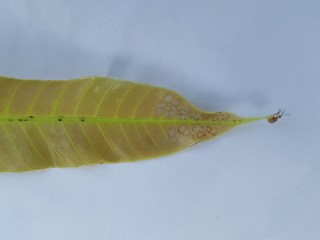

In [24]:
from IPython.display import Image
Image("/content/drive/MyDrive/mango leaf/train_data/20211008_124249 (Custom).jpg")

In [25]:
# now, lets create filepaths for all ids in the labels_csv
filenames=["drive/MyDrive/mango leaf/train_data/"+id for id in train_labels["id"]] # Added '/'

In [26]:
filenames[:10]

['drive/MyDrive/mango leaf/train_data/20211129_162005 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211011_153126 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211011_153447 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/20211129_160816 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211108_122730 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/20211129_160917 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211108_121329 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211108_120922 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211106_170145 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211106_161437 (Custom).jpg']

In [27]:
import os
if len(os.listdir("drive/My Drive/mango leaf/train_data/")) == len(filenames):
  print("filenames lists size is equal to our train data files. proceed!")
else:
  print("filenames lists size doesnot equal to actual size of train data file.Check the target directory.")

filenames lists size is equal to our train data files. proceed!


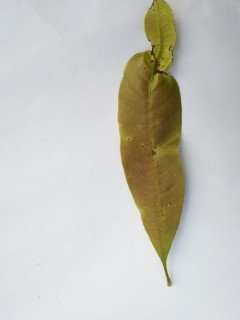

In [28]:
from PIL import Image, ImageOps
from IPython.display import display
import random

random_index = random.randint(0, len(filenames))

image = Image.open(filenames[random_index])
display(image)

In [29]:
random_index

386

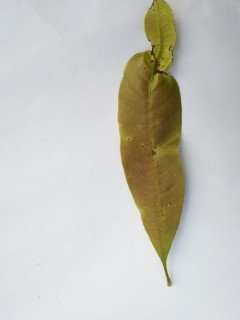

In [30]:
image = Image.open(filenames[random_index])
display(image)

In [31]:
train_labels["disease"][random_index]

'Anthracnose'

In [32]:
import numpy as np
labels = train_labels["disease"]
labels = np.array(labels)
labels

array(['Die Back', 'Anthracnose', 'Anthracnose', ..., 'Sooty Mould',
       'Sooty Mould', 'Die Back'], dtype=object)

In [33]:
len(labels)

3200

In [34]:
if len(labels) == len(filenames):
  print("labels lists size is equal to our train data files. proceed!")
else:
  print("labels lists size doesnot equal to actual size of train data file.Check the target directory.")


labels lists size is equal to our train data files. proceed!


In [35]:
distinct_disease_names = np.unique(labels)
distinct_disease_names,len(distinct_disease_names)

(array(['Anthracnose', 'Bacterial Canker', 'Cutting Weevil', 'Die Back',
        'Gall Midge', 'Healthy', 'Powdery Mildew', 'Sooty Mould'],
       dtype=object),
 8)

In [36]:
#labels is a file of length 3200. in that we are accessing the first label and comparing it with distinct_disease_names
print(labels[0] == distinct_disease_names)

[False False False  True False False False False]


In [37]:
boolean_labels = [i == distinct_disease_names for i in labels]
boolean_labels[:10]

[array([False, False, False,  True, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False]),
 array([False, False, False,  True, False, False, False, False]),
 array([False, False, False, False, False, False, False,  True]),
 array([False, False, False,  True, False, False, False, False]),
 array([False, False, False, False, False, False, False,  True]),
 array([False, False, False, False, False, False, False,  True]),
 array([False, False, False, False,  True, False, False, False]),
 array([False, False, False, False,  True, False, False, False])]

In [38]:
# boolean labels is nothing but boolean form of the labels array
len(boolean_labels),len(labels) == len(boolean_labels)

(3200, True)

In [39]:
#lets get the first disease from the labels
labels[0]

'Die Back'

In [40]:
# for "Die_back" disease we are going to check the index of it in distinct_disease_names array
print(np.where(distinct_disease_names == labels[0]))

(array([3]),)


### so the 3rd disease is Die_back

In [41]:
# we also have boolean labels array. we are going to check the disease index in that array
print(boolean_labels[0].argmax())

3


In [42]:
#convert boolean_labelsfirst array from boolean to integer
print(boolean_labels[0].astype(int))

[0 0 0 1 0 0 0 0]


In [43]:
print(boolean_labels[1].astype(int))

[1 0 0 0 0 0 0 0]


In [44]:
np.array(boolean_labels).shape

(3200, 8)

## Above , we checked the shape of boolean_labels array
## it has 3200 elements. each element is 8 in length

In [45]:
filenames[0]

'drive/MyDrive/mango leaf/train_data/20211129_162005 (Custom).jpg'

## lets check the first image and its index

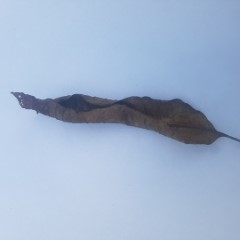

In [46]:
image = Image.open(filenames[0])
display(image)

In [47]:
index = boolean_labels[0]

In [48]:
label=distinct_disease_names[boolean_labels[0].argmax()]
label

'Die Back'

In [49]:
train_labels.iloc[0]

,0
id,20211129_162005 (Custom).jpg
disease,Die Back


## lets second image

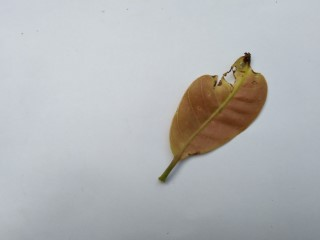

In [50]:
image1 = Image.open(filenames[1])
image1

In [51]:
label=distinct_disease_names[boolean_labels[1].argmax()]
label

'Anthracnose'

## Lets start the project with 1000 images in the beginning and will add all images later on.

In [52]:
NUM_IMAGES = 640 # @param {"type" : "slider","min":320,"max":3200,"step":320}

In [53]:
x = filenames
y = boolean_labels

In [54]:
from sklearn.model_selection import train_test_split
np.random.seed(42)
x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size = 0.2,random_state = 42)

In [55]:
len(x_train),len(x_val)

(512, 128)

In [56]:
len(y_train),len(y_val)

(512, 128)

In [57]:
x_train[:5],y_train[:5]

(['drive/MyDrive/mango leaf/train_data/IMG_20211211_154038 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/20211129_160506 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/IMG_20211106_140949 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/IMG_20211011_165123 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/IMG_20211106_161101 (Custom).jpg'],
 [array([False, False, False, False, False, False, False,  True]),
  array([False, False, False,  True, False, False, False, False]),
  array([False,  True, False, False, False, False, False, False]),
  array([ True, False, False, False, False, False, False, False]),
  array([False, False, False, False,  True, False, False, False])])

1. In the above x_train, it is nothing but our image.
2. In the above y_train,it is nothing but our corresponding label to the image.
3. Now, we need to convert our images into the numerical format. i.e in the form of tensors.
4. we are now preprocessing the data
5. i.e we are converting our images in the form of tensors.(numericals)



array([[[ 21,  22,   8],
        [ 21,  22,   8],
        [ 23,  24,  10],
        ...,
        [206, 186, 195],
        [220, 197, 207],
        [233, 210, 220]],

       [[ 21,  22,   8],
        [ 19,  20,   6],
        [ 19,  20,   6],
        ...,
        [230, 210, 219],
        [217, 196, 205],
        [206, 185, 194]],

       [[ 27,  25,  12],
        [ 25,  23,  10],
        [ 23,  21,   8],
        ...,
        [238, 223, 230],
        [235, 218, 226],
        [230, 213, 221]],

       ...,

       [[217, 215, 216],
        [217, 215, 216],
        [217, 215, 216],
        ...,
        [226, 225, 221],
        [231, 230, 226],
        [230, 229, 225]],

       [[218, 216, 217],
        [218, 216, 217],
        [217, 215, 216],
        ...,
        [222, 221, 217],
        [226, 225, 221],
        [228, 227, 223]],

       [[218, 216, 217],
        [218, 216, 217],
        [217, 215, 216],
        ...,
        [226, 225, 221],
        [223, 222, 218],
        [229, 228, 224]]], dtype=uint8)
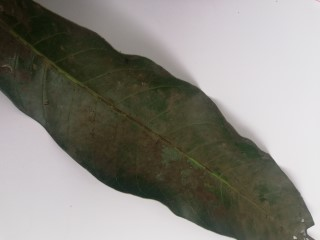

In [58]:
#initially lets check how our images are.
from matplotlib.pyplot import imread
image = imread(x_train[0])
#lets get the label of above image
label = y_train[0]
label = distinct_disease_names[label.argmax()]
image


In [59]:
print(label)

Sooty Mould


### Let's visualize first 9 images along with their labels of the train image

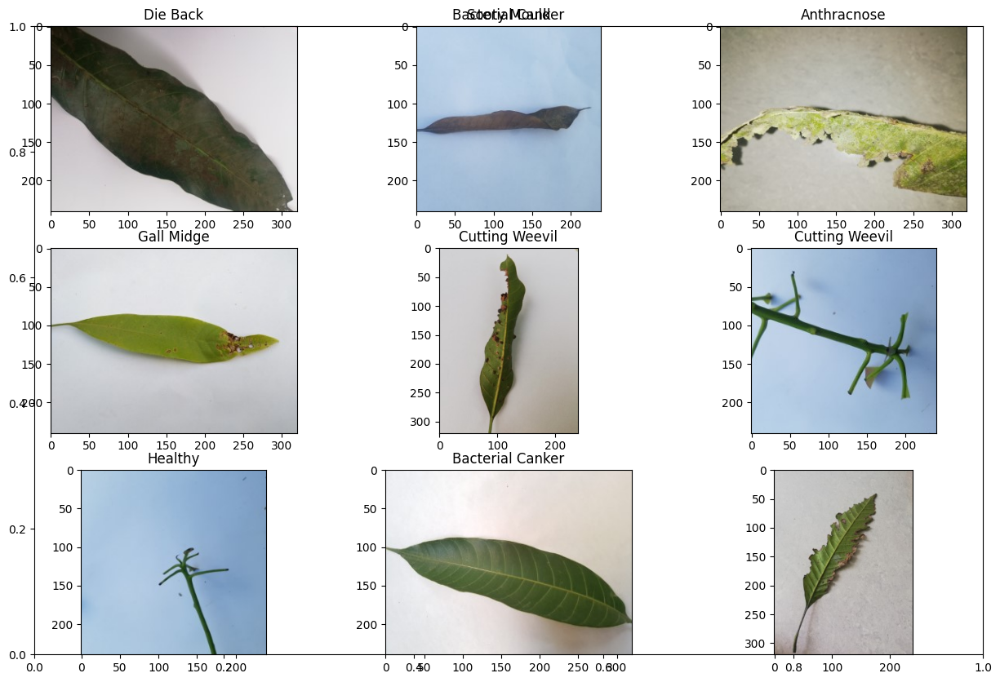

In [60]:
import matplotlib.pyplot as plt

# Assuming x_train, y_train, and distinct_disease_names are defined

plt.figure(figsize=(15, 10))  # Set the figure size to 15 inches wide and 10 inches tall

for i in range(9):
  image = plt.imread(x_train[i])
  label = y_train[i]  # Corrected to use y_train[i] to get the correct label for each image
  label = distinct_disease_names[label.argmax()]
  plt.title(label)
  plt.subplot(3, 3, i+1)
  plt.imshow(image)

plt.show()

array([[[201, 201, 201],
        [201, 201, 201],
        [202, 202, 202],
        ...,
        [164, 153, 147],
        [163, 152, 146],
        [165, 154, 148]],

       [[202, 202, 202],
        [202, 202, 202],
        [203, 203, 203],
        ...,
        [168, 157, 151],
        [166, 155, 149],
        [166, 155, 149]],

       [[203, 203, 203],
        [204, 204, 204],
        [204, 204, 204],
        ...,
        [169, 158, 152],
        [168, 157, 151],
        [167, 156, 150]],

       ...,

       [[128, 111, 101],
        [129, 112, 102],
        [134, 117, 107],
        ...,
        [170, 164, 164],
        [172, 166, 166],
        [173, 167, 167]],

       [[122, 105,  95],
        [127, 110, 100],
        [134, 117, 107],
        ...,
        [168, 162, 164],
        [168, 162, 164],
        [168, 162, 164]],

       [[118, 101,  91],
        [127, 110, 100],
        [134, 117, 107],
        ...,
        [168, 162, 164],
        [167, 161, 163],
        [167, 161, 163]]], dtype=uint8)
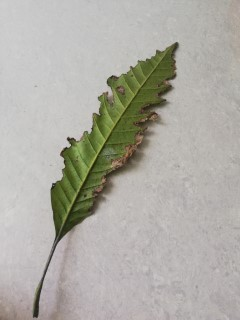

In [61]:
image

In [62]:
image.shape

(320, 240, 3)

In [63]:
image.max(),image.min()

(214, 0)

In [64]:
image[:3]

array([[[201, 201, 201],
        [201, 201, 201],
        [202, 202, 202],
        ...,
        [164, 153, 147],
        [163, 152, 146],
        [165, 154, 148]],

       [[202, 202, 202],
        [202, 202, 202],
        [203, 203, 203],
        ...,
        [168, 157, 151],
        [166, 155, 149],
        [166, 155, 149]],

       [[203, 203, 203],
        [204, 204, 204],
        [204, 204, 204],
        ...,
        [169, 158, 152],
        [168, 157, 151],
        [167, 156, 150]]], dtype=uint8)

In [65]:
import tensorflow as tf

In [66]:
tf.constant(image)
# The above code converts our image in the form of tensors.(i.e in the form of tensors). we will not understand anything from that tensors. But, our computer can understand it from the data.

<tf.Tensor: shape=(320, 240, 3), dtype=uint8, numpy=
array([[[201, 201, 201],
        [201, 201, 201],
        [202, 202, 202],
        ...,
        [164, 153, 147],
        [163, 152, 146],
        [165, 154, 148]],

       [[202, 202, 202],
        [202, 202, 202],
        [203, 203, 203],
        ...,
        [168, 157, 151],
        [166, 155, 149],
        [166, 155, 149]],

       [[203, 203, 203],
        [204, 204, 204],
        [204, 204, 204],
        ...,
        [169, 158, 152],
        [168, 157, 151],
        [167, 156, 150]],

       ...,

       [[128, 111, 101],
        [129, 112, 102],
        [134, 117, 107],
        ...,
        [170, 164, 164],
        [172, 166, 166],
        [173, 167, 167]],

       [[122, 105,  95],
        [127, 110, 100],
        [134, 117, 107],
        ...,
        [168, 162, 164],
        [168, 162, 164],
        [168, 162, 164]],

       [[118, 101,  91],
        [127, 110, 100],
        [134, 117, 107],
        ...,
        [168, 162, 16

## Now , we need to convert our images into small batches of size 32.
## By default the batch size will be 32 however.
## Though we are working with the GPU, it is going to take lot of time for our model to take lot of time to get trained when we load 1000's of images. that's why we use batches.
## A 32 images are together called as one batch. in that way we are going to create total_images/32 batches for our model.
## In order to use Tensorflow effectively, we need to convert our data in the form of tensor tuples. i.e  (image,tuple).
## in the previous functon, we created a code that convertsour data in the form of tensors. now, we need to create another function that converts that image in the form of tuples. i.e  (image,label).
## here in tuple, image means converted image, label means the associated label to that converted image.
## lets create that function.

In [67]:
# we have x a image path and y as boolean labels.
x[:10]

['drive/MyDrive/mango leaf/train_data/20211129_162005 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211011_153126 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211011_153447 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/20211129_160816 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211108_122730 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/20211129_160917 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211108_121329 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211108_120922 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211106_170145 (Custom).jpg',
 'drive/MyDrive/mango leaf/train_data/IMG_20211106_161437 (Custom).jpg']

In [68]:

y[:10]

[array([False, False, False,  True, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False]),
 array([False, False, False,  True, False, False, False, False]),
 array([False, False, False, False, False, False, False,  True]),
 array([False, False, False,  True, False, False, False, False]),
 array([False, False, False, False, False, False, False,  True]),
 array([False, False, False, False, False, False, False,  True]),
 array([False, False, False, False,  True, False, False, False]),
 array([False, False, False, False,  True, False, False, False])]

In [69]:
IMG_SIZE = 224

def process_image(image_path, image_size=IMG_SIZE):
    """ Takes the image file path and converts it to a tensor with the specified size. """
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, (image_size, image_size))  # Correct usage without image_size= keyword
    return image


## Whats happening in the above code? lets analyse it step by step!
### 1. we initially read the image file path.
### 2. now convert the images in the form of tensors using 3 channel colors.
### 3. now, the color channel values are converted from the range of 0-255 to 0-1 scale.
### 4. Finally, we resize the image in the form 224*224.

# **lets walt through the first x_train[0] of the above function to know whats really happening in the function with our images**

In [70]:
tensor = tf.io.read_file(x_train[0])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00`\x00`\x00\x00\xff\xe19\xf2Exif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x0f\x01\x00\x00\x03\x00\x00\x00\x01\x12\x00\x00\x00\x01\x01\x00\x03\x00\x00\x00\x01\r\x80\x00\x00\x01\x02\x00\x03\x00\x00\x00\x03\x00\x00\x00\xc2\x01\x0e\x00\x02\x00\x00\x00\x04dav\x00\x01\x0f\x00\x02\x00\x00\x00\x07\x00\x00\x00\xc8\x01\x10\x00\x02\x00\x00\x00\x08\x00\x00\x00\xd0\x01\x12\x00\x03\x00\x00\x00\x01\x00\x00\x00\x00\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\x00\xd8\x01\x1b\x00\x05\x00\x00\x00\x01\x00\x00\x00\xe0\x01(\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x011\x00\x02\x00\x00\x00\x18\x00\x00\x00\xe8\x012\x00\x02\x00\x00\x00\x14\x00\x00\x01\x00\x02\x13\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x01\x14\xa4\x0b\x00\x07\x00\x00\x00\x04ipp\x00\x00\x00\x04\x0c\x00\x08\x00\x08\x00\x08HUAWEI\x00\x00RNE-L22\x00\x00\x00\x00H\x00\x00\x00\x01\x00\x00\x00H\x00\x00\x00\x01RNE-L22 8.0.0.361(C636)\x00

In [71]:
# the above image is in the form of raw ensor. now its needed to be conerted in the form of 3 channel color
tensor = tf.image.decode_jpeg(tensor,channels=3)
tensor

<tf.Tensor: shape=(240, 320, 3), dtype=uint8, numpy=
array([[[ 21,  22,   8],
        [ 20,  21,   7],
        [ 23,  24,  10],
        ...,
        [204, 187, 193],
        [219, 198, 205],
        [231, 210, 217]],

       [[ 20,  21,   7],
        [ 19,  20,   6],
        [ 19,  20,   6],
        ...,
        [227, 210, 216],
        [216, 197, 203],
        [205, 186, 192]],

       [[ 26,  24,  11],
        [ 24,  22,   9],
        [ 23,  21,   8],
        ...,
        [236, 224, 228],
        [233, 218, 223],
        [230, 213, 219]],

       ...,

       [[217, 216, 214],
        [217, 216, 214],
        [216, 215, 213],
        ...,
        [225, 224, 220],
        [229, 230, 224],
        [228, 229, 223]],

       [[217, 216, 214],
        [217, 216, 214],
        [217, 216, 214],
        ...,
        [221, 220, 216],
        [225, 226, 221],
        [226, 227, 222]],

       [[217, 216, 214],
        [217, 216, 214],
        [217, 216, 214],
        ...,
        [226, 225, 22

In [72]:
# now that raw file is converted into numericals
# now our color channel values are needed to be converted from 0-255 to 0-1 scale.
tensor = tf.image.convert_image_dtype(tensor,tf.float32)
tensor

<tf.Tensor: shape=(240, 320, 3), dtype=float32, numpy=
array([[[0.08235294, 0.08627451, 0.03137255],
        [0.07843138, 0.08235294, 0.02745098],
        [0.09019608, 0.09411766, 0.03921569],
        ...,
        [0.8000001 , 0.73333335, 0.7568628 ],
        [0.8588236 , 0.77647066, 0.80392164],
        [0.9058824 , 0.8235295 , 0.85098046]],

       [[0.07843138, 0.08235294, 0.02745098],
        [0.07450981, 0.07843138, 0.02352941],
        [0.07450981, 0.07843138, 0.02352941],
        ...,
        [0.89019614, 0.8235295 , 0.8470589 ],
        [0.8470589 , 0.7725491 , 0.7960785 ],
        [0.80392164, 0.7294118 , 0.75294125]],

       [[0.10196079, 0.09411766, 0.04313726],
        [0.09411766, 0.08627451, 0.03529412],
        [0.09019608, 0.08235294, 0.03137255],
        ...,
        [0.92549026, 0.87843144, 0.8941177 ],
        [0.91372555, 0.854902  , 0.8745099 ],
        [0.90196085, 0.8352942 , 0.8588236 ]],

       ...,

       [[0.85098046, 0.8470589 , 0.83921576],
        [0.85

In [73]:
def get_image_label(image, label):
    """ Takes the input converted image path and returns a tuple (image, label) """
    image = process_image(image)  # Process the image using the corrected function
    return image, label


## Whats happening in the above code? lets analyse it step by step!
### 1. we initially read the image file path.
### 2. now convert the images in the form of tensors using 3 channel colors.
### 3. now, the color channel values are converted from the range of 0-255 to 0-1 scale.
### 4. Finally, we resize the image in the form 224*224.

In [74]:
BATCH_SIZE = 32

def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """ Creates data batches of size 32 for (image, label) tuples """
    if test_data:
        print("We are creating the test data batches....")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))  # Only image paths, no labels
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch
    elif valid_data:
        print("We are creating the validation data batches....")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))  # Includes labels
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch
    else:
        print("We are creating the training data batches....")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))  # Includes labels
        data = data.shuffle(buffer_size=len(x))  # Shuffle for training data
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch


## Lets create a training batch!

In [75]:
train_data = create_data_batches(x_train, y_train)
train_data


We are creating the training data batches....


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 8), dtype=tf.bool, name=None))>

# Lets create a validation batch!

In [76]:
val_data = create_data_batches(x_val, y_val, valid_data=True)
val_data

We are creating the validation data batches....


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 8), dtype=tf.bool, name=None))>

## lets now look at some basic numpy array concept of argmax.
## lets create a numpy array.

In [77]:
array = np.array([1,3,6,9,26,45,12,15,16])
print("the maximum value index in the array is:",array.argmax())

the maximum value index in the array is: 5


## so, that means argmax() return the index of maximumvalue in an araay rather than returning the maximum value.
## This point needed to be noted!!

In [78]:
labels

array(['Die Back', 'Anthracnose', 'Anthracnose', ..., 'Sooty Mould',
       'Sooty Mould', 'Die Back'], dtype=object)

In [79]:
y[:10]

[array([False, False, False,  True, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False]),
 array([False, False, False,  True, False, False, False, False]),
 array([False, False, False, False, False, False, False,  True]),
 array([False, False, False,  True, False, False, False, False]),
 array([False, False, False, False, False, False, False,  True]),
 array([False, False, False, False, False, False, False,  True]),
 array([False, False, False, False,  True, False, False, False]),
 array([False, False, False, False,  True, False, False, False])]

In [80]:
y[0]

array([False, False, False,  True, False, False, False, False])

In [81]:
y[0].argmax()

3

that means at index 3, we have the true value and thats the actual index.

In [82]:
#lets check the actual label from distinct_disease_names array.
distinct_disease_names[y[0].argmax()],distinct_disease_names[3]

('Die Back', 'Die Back')

## we converted our data into batches. but we did not understood the format of the batches since it is not visible how the things are going on inside the data batches.
## so lets visualize them more clearly through diagrams. i.e images.
## we will check how our data labels is visible with argmax()

In [83]:
import matplotlib.pyplot as plt
def show_25_images(images,labels):
  """ this function plots the first 25 images from the data batch"""
  plt.figure(figsize=(15,15))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(distinct_disease_names[labels[i].argmax()])

In [84]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 8), dtype=tf.bool, name=None))>

## we use numpy iterator.
## this is going to take our train data batch and going to unwind it from a batch and turn it into numpy iterator
## "next" is going to grab our first data batch.

In [85]:
train_images,train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          ...,
          [0.8797917 , 0.8918265 , 0.9113241 ],
          [0.8906563 , 0.90196073, 0.91107446],
          [0.8979897 , 0.90191126, 0.9214891 ]],
 
         [[0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          ...,
          [0.8871149 , 0.90602255, 0.8875847 ],
          [0.9088135 , 0.915106  , 0.91038424],
          [0.90177095, 0.9049422 , 0.9233497 ]],
 
         [[0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          ...,
          [0.89251715, 0.9079734 , 0.8418667 ],
          [0.8941076 , 0.8988995 , 0.8649661 ],
          [0.88761526, 0.8838337 , 0.8962891 ]],
 
         ...,
 
         [[0.8705883 , 0.8705883 , 0.8705883 ],
          [0.86806

In [86]:
len(train_images),len(train_labels)

(32, 32)

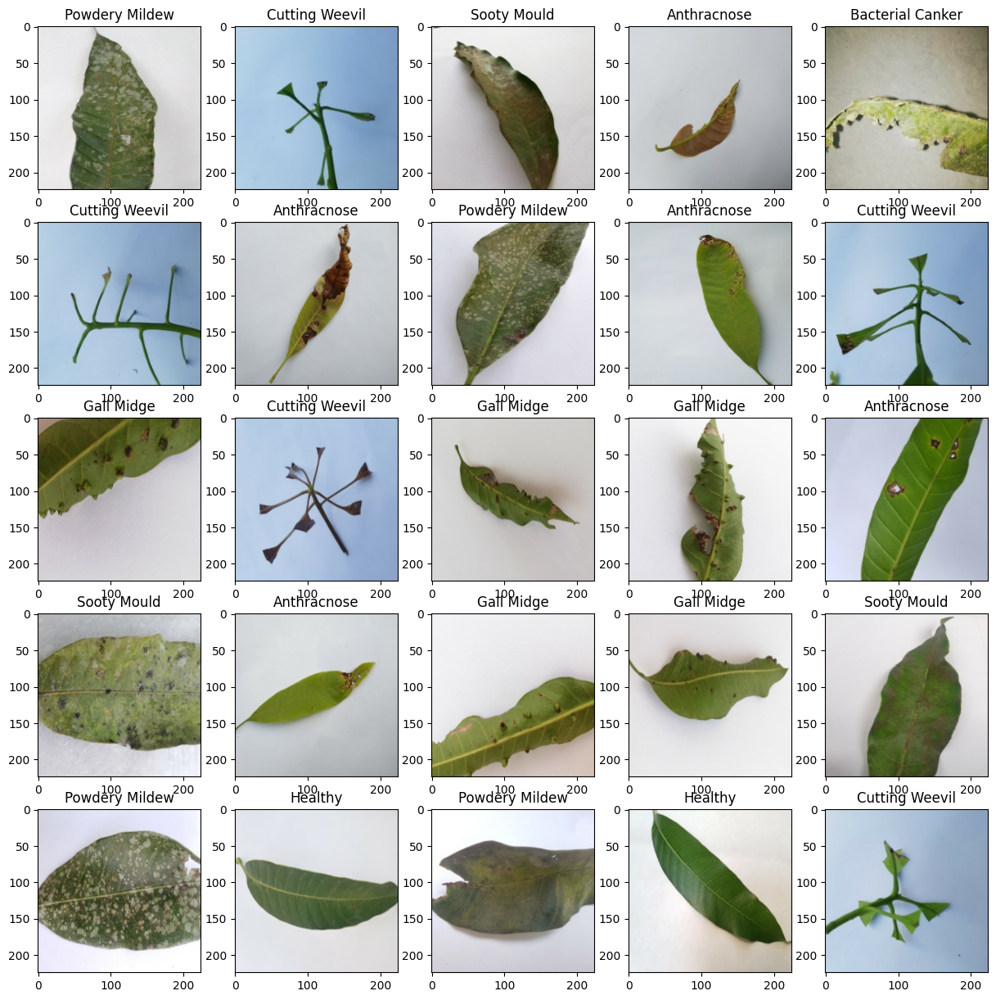

In [87]:
train_images,train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

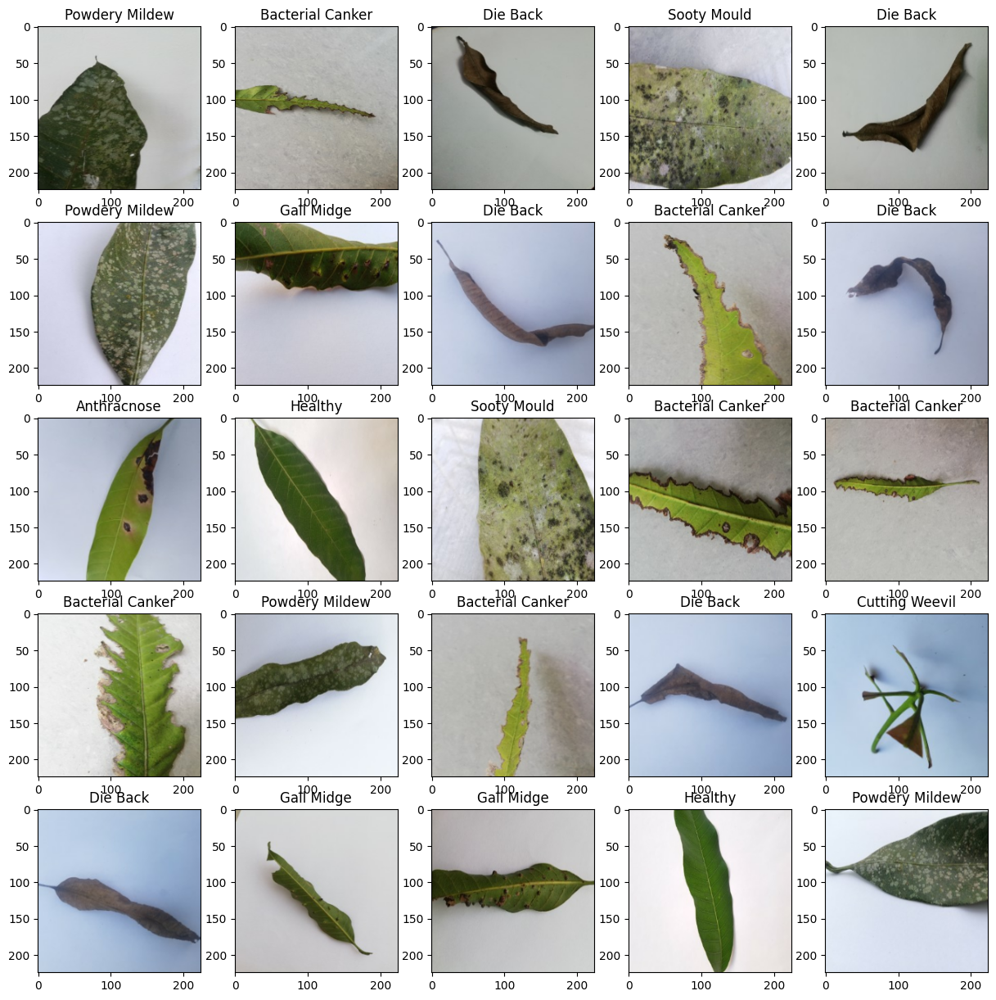

In [88]:
# lets visualize our validation data
val_images,val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model
Now, we will built the model .Before building the model, there are few things needed to be considered
1. The input shape of our model.(our image shape in the form of Tensors)
2. The output shape of our model.(image labels, in the form of tensors)
3. The URL of the model we want to use: "https://tfhub.dev/google/imagenet/inception_v3/feature_vector/5"

In [89]:
IMG_SIZE=224
#i.e batch,height,width,color channels
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
#i.e output shape
OUTPUT_SHAPE=len(distinct_disease_names)
MODEL_URL = "https://tfhub.dev/google/imagenet/inception_v3/feature_vector/5"


## We have got our inputs,outputs and model.Lets put them together into a keras deep learning model
## Lets create a function that takes input shape , output shape and model we have chosen .
## Defines the layer in the keras modelin sequential fashion.
## i.e that means do this first,then this , then that ...
## Compiles the model. (says it should be evaluated and improved)
## Builds the model (tells the model input shape it will be getting.)
## return the model

In [90]:
#pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

In [91]:

#pip install tf_keras

In [92]:
import tf_keras
import tensorflow_hub as hub

In [93]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", model_url)
  # Setup the model layers
  model = tf_keras.Sequential([hub.KerasLayer(model_url),
  tf_keras.layers.Dense(units=output_shape,activation="softmax")  ])

  # Compile the model
  model.compile(loss=tf_keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
  optimizer=tf_keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
  metrics=["accuracy"]    )


  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  return model

In [94]:
model = create_model()
model

Building model with:  https://tfhub.dev/google/imagenet/inception_v3/feature_vector/5


In [95]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 2048)              21802784  
                                                                 
 dense (Dense)               (None, 8)                 16392     
                                                                 
Total params: 21819176 (83.23 MB)
Trainable params: 16392 (64.03 KB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


## **Creating Callbacks**
callbacks are helper functions a model can use during training to do such things as save its progress , check its progress or stop training model if a model stops improving

we will create two callbacks.

1. one for TensorBoard which helps track our model.
2. another for early stopping which prevents our model from training for too long. Note : Tensorboard is like a dashboard for seeing how well our model is doing. i.e seeing the loss function

## **TensorBoard Callback**
## **To create a TensorBoard call abck we need to do 3 things. they are:**

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our models "fit()" function.
3. Visualize our models training logs with the '%tensorboard' magic function. ( we will do this after model training).

In [96]:
#load tensorboard notebook extension
%load_ext tensorboard

In [97]:
import datetime
#create a function to create a tensorflow callback
def tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/mango leaf/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

### Lets create early stopping call back
### we stop our model from getting trained when a certain evaluaton metric stps improving.
### that means training a lot on certain dataset perform well on that dataset but fails on another data set. i.e over fitting.

In [98]:
#create a early stopping callback
early_stopping_callback = tf_keras.callbacks.EarlyStopping(monitor = "val_loss",patience =3)

## **Training a model on the subset data**
our first model is going to take on 640 images and we need to make sure everything is working fine!!!

In [99]:
#Epochs is nothing but but we are giving our model no of chances to go and learn from the train data
NUMBER_OF_EPOCHS = 100 #@param {type :"slider",min : 10,max : 100,step : 10}

In [100]:
# check whether we are connnected to the GPU or not.because, if GPU was not available its not going to get trained.
print("GPU IS AVAILABLE!!!!" if tf.config.list_physical_devices("GPU") else "GPU is not available!!!")

GPU IS AVAILABLE!!!!


## **Let's create a function which trains the model**

1. create a model using creat_model().
2. Setup a TensorBoard callback using "create_tensorboard_callback()".
3. Call the fit() function on our model passing it the training data,validation data,no of epochs to train for ('NUMBER_OF_EPOCHS') and the callbacks we would like to use.
4. Return the model.

In [101]:
# build the function to train and return the model
def model_training():
  """Trains a given model and return the trained model"""
  model = create_model()
  tensorboard = tensorboard_callback()
  model.fit(x = train_data,
            epochs = NUMBER_OF_EPOCHS,validation_data = val_data,validation_freq = 1,callbacks = [tensorboard,early_stopping_callback])
  return model

In [102]:
model = model_training()

Building model with:  https://tfhub.dev/google/imagenet/inception_v3/feature_vector/5
Epoch 1/100
16/16 [==============================] - 13s 253ms/step - loss: 1.4968 - accuracy: 0.4824 - val_loss: 1.1214 - val_accuracy: 0.6797
Epoch 2/100
16/16 [==============================] - 2s 123ms/step - loss: 0.5297 - accuracy: 0.8711 - val_loss: 0.5538 - val_accuracy: 0.8438
Epoch 3/100
16/16 [==============================] - 2s 141ms/step - loss: 0.3046 - accuracy: 0.9316 - val_loss: 0.4460 - val_accuracy: 0.8672
Epoch 4/100
16/16 [==============================] - 2s 132ms/step - loss: 0.2186 - accuracy: 0.9473 - val_loss: 0.3911 - val_accuracy: 0.8906
Epoch 5/100
16/16 [==============================] - 2s 147ms/step - loss: 0.1552 - accuracy: 0.9805 - val_loss: 0.3431 - val_accuracy: 0.9141
Epoch 6/100
16/16 [==============================] - 3s 187ms/step - loss: 0.1265 - accuracy: 0.9863 - val_loss: 0.3294 - val_accuracy: 0.8906
Epoch 7/100
16/16 [==============================] - 2s

**Training Loss and Accuracy:**
1. Your training loss is very low (0.0133 to 0.0125), and your training accuracy is perfect (1.0000), which suggests your model has learned the training data very well.
**The validation accuracy:** is consistently high (0.9375), indicating that your model generalizes reasonably well to unseen data.
However, the validation loss is higher than the training loss (0.2449 to 0.2548), showing a potential gap where your model is slightly overfitting to the training data.


In [103]:
%tensorboard --logdir drive/My\ Drive/mango\ leaf/logs

<IPython.core.display.Javascript object>

**Let's evaluate our model.**
we can see the output in the form of softmax.
# **SOFTMAX**
The softmax function is a function that turns a vector of K real values into a vector of K real values that sum to 1. The input values can be positive, negative, zero, or greater than one, but the softmax transforms them into values between 0 and 1, so that they can be interpreted as probabilities.

In [104]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 8), dtype=tf.bool, name=None))>

In [105]:

#we need to make predictions on the validation data
predictions= model.predict(val_data,verbose=1)
predictions

4/4 [==============================] - 4s 96ms/step


array([[1.84900630e-02, 4.85835336e-02, 3.07011977e-02, ...,
        1.67297455e-03, 8.61167371e-01, 1.58879589e-02],
       [2.27414723e-03, 9.96921599e-01, 9.63980638e-05, ...,
        3.41673655e-07, 2.00028138e-04, 6.76429991e-05],
       [1.18341693e-03, 1.46756414e-03, 2.62486792e-05, ...,
        4.25831416e-07, 2.01683398e-03, 1.91239596e-04],
       ...,
       [4.32096049e-03, 3.71385366e-02, 1.21189475e-01, ...,
        1.53687986e-04, 3.99844646e-02, 1.84152031e-03],
       [9.75993216e-01, 1.77268742e-03, 4.91130686e-06, ...,
        1.22949434e-03, 2.52670230e-04, 1.91373490e-02],
       [4.16419469e-03, 2.49883905e-02, 6.67769811e-04, ...,
        1.50553295e-02, 1.51283294e-02, 3.67979147e-02]], dtype=float32)

## Our val data is nothing but the out of the 640 images, 128 images is our val data and 512 were our train data.

In [106]:
#lets see the shape of redictions
predictions.shape

(128, 8)

In [107]:
#lets see the first predicted image of validation data
predictions[0]

array([0.01849006, 0.04858353, 0.0307012 , 0.01418478, 0.00931217,
       0.00167297, 0.8611674 , 0.01588796], dtype=float32)

In [108]:
# the sum up value of above predictions is 1. lets verify it.
np.sum(predictions[0])

1.0

**NOTE :**
1. If our problem definition is Binary classification,our activation will be Sigmoid. our loss will be Binary Crossentropy.
2. If our problem definition if Multi-class Classification, our activation will be Softmax. Our loss will be Categorical Crossentropy.

for the above sum of first predictions we seen sum as 1. thats because of softmax that makes our process more efficient!!

### Lets work on our first prediction more details.
### The max value in the predicted array is our label.


In [109]:
index = 0
print(predictions[index])
print(f"Max value is: {np.max(predictions[index])}")
print(f"sum of the entire array is: {np.sum(predictions[index])}")
print(f"Max index position is: {np.argmax(predictions[index])}")
print(f"the predicted Label is : {distinct_disease_names[np.argmax(predictions[index])]}")

[0.01849006 0.04858353 0.0307012  0.01418478 0.00931217 0.00167297
 0.8611674  0.01588796]
Max value is: 0.8611673712730408
sum of the entire array is: 1.0
Max index position is: 6
the predicted Label is : Powdery Mildew


In [110]:
# Lets check the actual label
print(f"the actual label is",distinct_disease_names[np.argmax(val_labels[index])])

the actual label is Powdery Mildew


In [111]:
#lets work with another index
index = 10
print(predictions[index])
print(f"Max value is: {np.max(predictions[index])}")
print(f"sum of the entire array is: {np.sum(predictions[index])}")
print(f"Max index position is: {np.argmax(predictions[index])}")
print(f"The predicted Label is: {distinct_disease_names[np.argmax(predictions[index])]}")

[9.6254981e-01 8.5030141e-04 1.1343154e-04 4.4771517e-03 2.5983863e-02
 9.6991957e-05 9.4823161e-04 4.9802540e-03]
Max value is: 0.9625498056411743
sum of the entire array is: 1.0
Max index position is: 0
The predicted Label is: Anthracnose


In [112]:
#lets check the actual label
print("the actual label is",distinct_disease_names[np.argmax(val_labels[index])])

the actual label is Anthracnose


In [113]:
print("TensorFlow version:", tf.__version__)
print("TensorFlow Hub version:", hub.__version__)
print("Keras version:",tf_keras.__version__)

TensorFlow version: 2.17.0
TensorFlow Hub version: 0.16.1
Keras version: 2.17.0


In [114]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.

  """
  return distinct_disease_names[np.argmax(prediction_probabilities)]


In [115]:
get_pred_label(predictions[10])

'Anthracnose'

In [116]:
get_pred_label(predictions[4])


'Die Back'

Since our validation data is in the form of batches, we need to unbatch them. so that we can make predictions on validation images and then compare those predictions to the validation labels

In [117]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 8), dtype=tf.bool, name=None))>

In [118]:
#initially lets write that without using function
images_=[]
labels_=[]
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

In [119]:
images_[0],labels_[0]

(array([[[0.8226891 , 0.83053225, 0.8266107 ],
         [0.8198349 , 0.827678  , 0.82375646],
         [0.8188707 , 0.82671386, 0.8227923 ],
         ...,
         [0.7994154 , 0.81902325, 0.803337  ],
         [0.79327774, 0.8128856 , 0.7971993 ],
         [0.7686275 , 0.78823537, 0.7725491 ]],
 
        [[0.81708694, 0.8249301 , 0.8210085 ],
         [0.81708694, 0.8249301 , 0.8210085 ],
         [0.8158583 , 0.82370144, 0.8197799 ],
         ...,
         [0.7993466 , 0.81895447, 0.8032682 ],
         [0.7929445 , 0.81255233, 0.79686606],
         [0.7711485 , 0.79075634, 0.7750701 ]],
 
        [[0.81568635, 0.8235295 , 0.8196079 ],
         [0.81568635, 0.8235295 , 0.8196079 ],
         [0.8191265 , 0.8269696 , 0.82304806],
         ...,
         [0.8029931 , 0.82260096, 0.8069147 ],
         [0.7946252 , 0.81423306, 0.7985468 ],
         [0.77282923, 0.7924371 , 0.7767508 ]],
 
        ...,
 
        [[0.1137255 , 0.14509805, 0.08627451],
         [0.1137255 , 0.14509805, 0.08627

In [120]:
#lets find the predicted label and compare it with actual true label
get_pred_label(labels_[0])


'Powdery Mildew'

In [121]:
get_pred_label(labels_[10])

'Anthracnose'

In [122]:
#lets create a function to unbatch our batch data
def unbatchify(data):
  """
  Takes a batched dataset of (image,labels) and returns seperate arrays
  of images and labels
  """
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(distinct_disease_names[np.argmax(label)])
  return images,labels



#unbatchify the validaton data
val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.8226891 , 0.83053225, 0.8266107 ],
         [0.8198349 , 0.827678  , 0.82375646],
         [0.8188707 , 0.82671386, 0.8227923 ],
         ...,
         [0.7994154 , 0.81902325, 0.803337  ],
         [0.79327774, 0.8128856 , 0.7971993 ],
         [0.7686275 , 0.78823537, 0.7725491 ]],
 
        [[0.81708694, 0.8249301 , 0.8210085 ],
         [0.81708694, 0.8249301 , 0.8210085 ],
         [0.8158583 , 0.82370144, 0.8197799 ],
         ...,
         [0.7993466 , 0.81895447, 0.8032682 ],
         [0.7929445 , 0.81255233, 0.79686606],
         [0.7711485 , 0.79075634, 0.7750701 ]],
 
        [[0.81568635, 0.8235295 , 0.8196079 ],
         [0.81568635, 0.8235295 , 0.8196079 ],
         [0.8191265 , 0.8269696 , 0.82304806],
         ...,
         [0.8029931 , 0.82260096, 0.8069147 ],
         [0.7946252 , 0.81423306, 0.7985468 ],
         [0.77282923, 0.7924371 , 0.7767508 ]],
 
        ...,
 
        [[0.1137255 , 0.14509805, 0.08627451],
         [0.1137255 , 0.14509805, 0.08627

In [123]:
#Now lets get the actual label of our validation data first image
get_pred_label(val_labels[0])

'Anthracnose'

In [124]:
# Now lets get the fist image of predicted label of our validation data first image
get_pred_label(predictions[0])

'Powdery Mildew'

In [125]:
get_pred_label(val_labels[10])

'Anthracnose'

In [126]:
get_pred_label(predictions[10])

'Anthracnose'

In [127]:
get_pred_label(val_labels[20]),get_pred_label(predictions[20])

('Anthracnose', 'Die Back')

In [128]:
get_pred_label(val_labels[15]),get_pred_label(predictions[15])

('Anthracnose', 'Bacterial Canker')

In [129]:
get_pred_label(val_labels[27]),get_pred_label(predictions[27])

('Anthracnose', 'Anthracnose')

In [130]:
get_pred_label(val_labels[30]),get_pred_label(predictions[30])

('Anthracnose', 'Sooty Mould')

In [131]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction, ground truth label and image for sample n
  """
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  #change the colorof the title depending on the predicton correct or not
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{}{:2.0f}%{}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

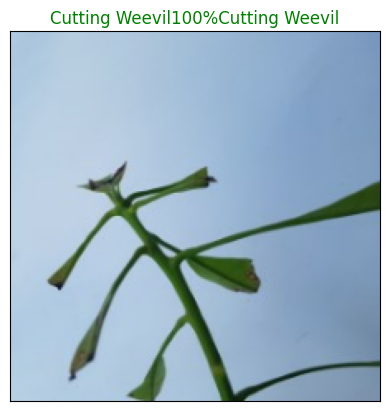

In [191]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=77)

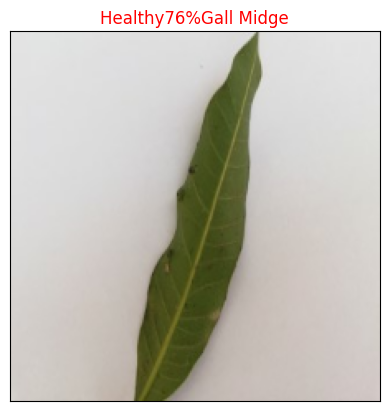

In [210]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=45)

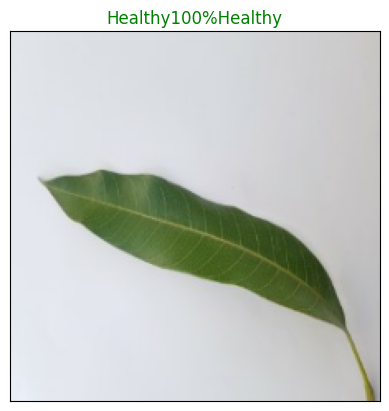

In [134]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=71)

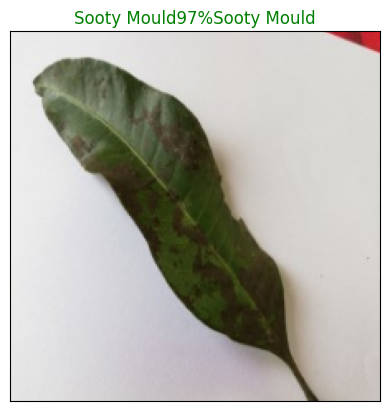

In [135]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=25)

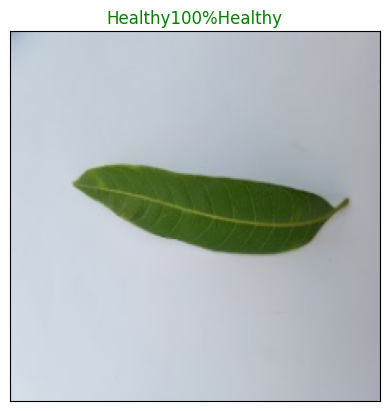

In [136]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=69)

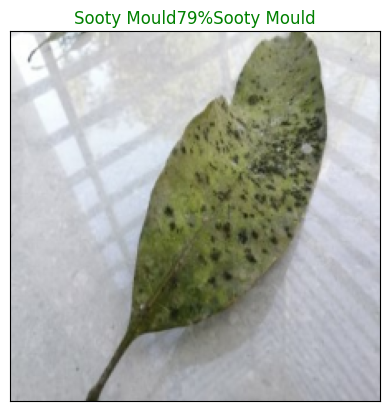

In [137]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=30)

In [138]:

def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label = prediction_probabilities[n],labels[n]
  pred_label = get_pred_label(pred_prob)
  top_5_pred_indexes = pred_prob.argsort()[-5:][::-1]
  top_5_pred_values = pred_prob[top_5_pred_indexes]
  top_5_pred_labels = distinct_disease_names[top_5_pred_indexes]
  top_plot = plt.bar(np.arange(5),top_5_pred_values,tick_label=top_5_pred_labels)
  plt.xticks(rotation="vertical")
  if np.isin(true_label,top_5_pred_labels):
    top_plot[np.argmax(top_5_pred_labels == true_label)].set_color("green")
  else:
    pass




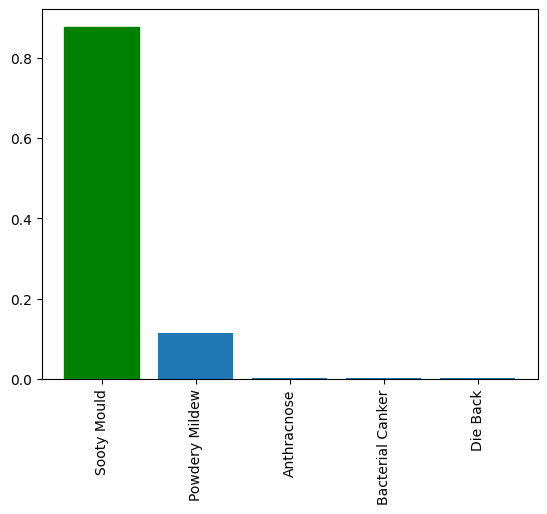

In [192]:
plot_pred_conf(prediction_probabilities = predictions,labels = val_labels,n=12)

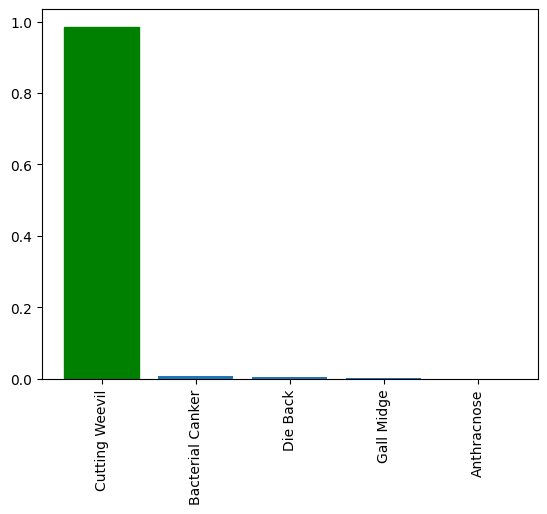

In [193]:
plot_pred_conf(prediction_probabilities = predictions,labels = val_labels,n=36)

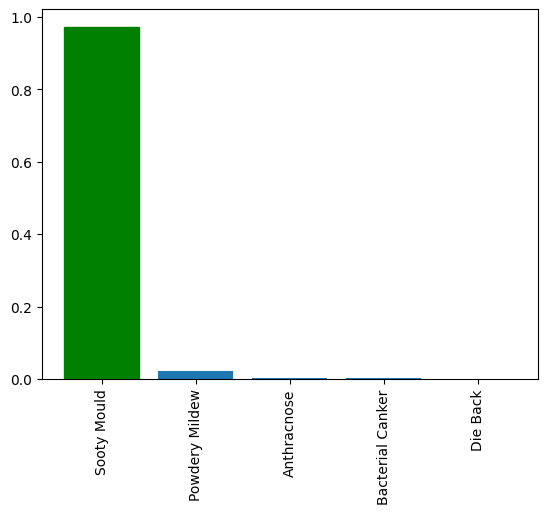

In [194]:
plot_pred_conf(prediction_probabilities = predictions,labels = val_labels,n=46)

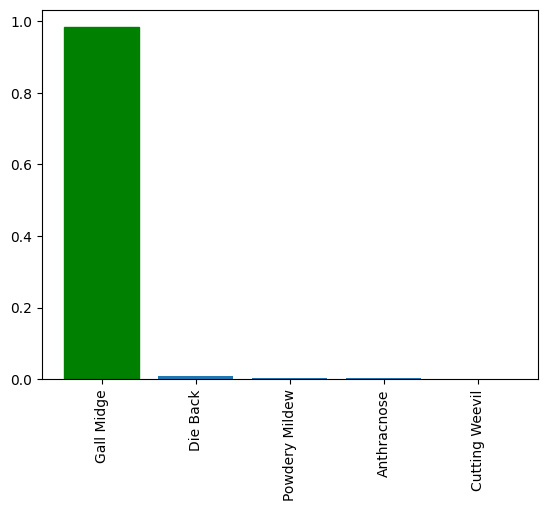

In [195]:
plot_pred_conf(prediction_probabilities = predictions,labels = val_labels,n=31)

## Saving and loading the trained model

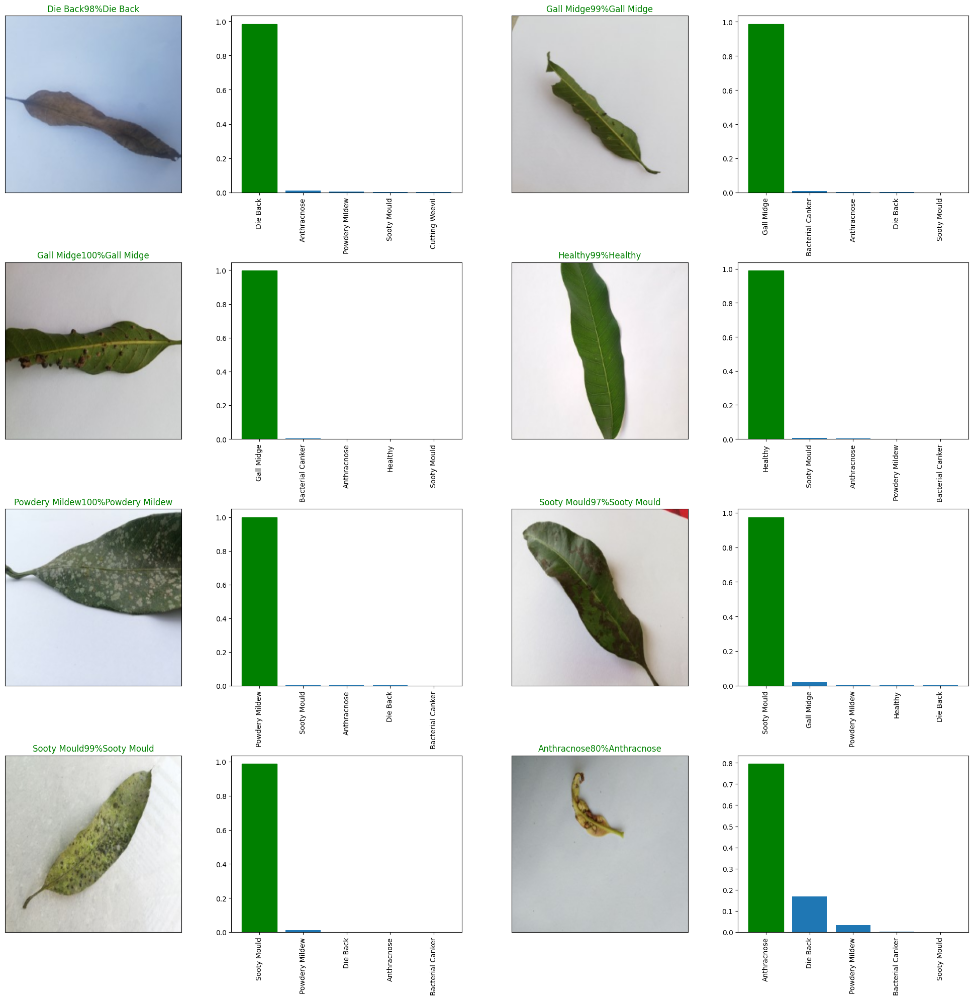

In [196]:
i_multiplier = 20
num_rows = 4
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [144]:
def save_model(model,suffix=None):
  modeldir = os.path.join("drive/MyDrive/mango leaf/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving mode to  {model_path}")
  model.save(model_path)
  return model_path


In [145]:
def load_model(model_path):
  print(f"loading saved model from {model_path}")
  model = tf_keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [146]:
save_model(model,"640-images-mobilenetv2-Adam")

Saving mode to  drive/MyDrive/mango leaf/models/20241115-035823-640-images-mobilenetv2-Adam.h5


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/mango leaf/models/20241115-035823-640-images-mobilenetv2-Adam.h5'

In [147]:
#Load a trained model
loaded_model = load_model('drive/MyDrive/mango leaf/models/20241114-045625-640-images-mobilenetv2-Adam.h5')

loading saved model from drive/MyDrive/mango leaf/models/20241114-045625-640-images-mobilenetv2-Adam.h5


#Evaluate the model
model.evaluate(val_data)

In [148]:
#Evaluate the model
model.evaluate(val_data)

4/4 [==============================] - 1s 133ms/step - loss: 0.2531 - accuracy: 0.9297


[0.2530735731124878, 0.9296875]

1. **Loss:** 0.2593455910682678 could represent the loss value of your model on the evaluation dataset. Loss is a measure of how well your model's predictions match the actual target values. Lower loss values generally indicate better model performance.

2. **Accuracy:** 0.9296875 could represent the accuracy of your model on the evaluation dataset. Accuracy is the proportion of correctly classified instances out of the total number of instances. In this case, an accuracy of 0.9296875 would mean that your model correctly classified approximately 92.97% of the instances in the evaluation dataset.

In [149]:
loaded_model.evaluate(val_data)

4/4 [==============================] - 1s 95ms/step - loss: 0.2594 - accuracy: 0.9297


[0.25935983657836914, 0.9296875]

# Load the entire dataset with the model

In [150]:
x[:10],y[:10]

(['drive/MyDrive/mango leaf/train_data/20211129_162005 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/IMG_20211011_153126 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/IMG_20211011_153447 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/20211129_160816 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/IMG_20211108_122730 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/20211129_160917 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/IMG_20211108_121329 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/IMG_20211108_120922 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/IMG_20211106_170145 (Custom).jpg',
  'drive/MyDrive/mango leaf/train_data/IMG_20211106_161437 (Custom).jpg'],
 [array([False, False, False,  True, False, False, False, False]),
  array([ True, False, False, False, False, False, False, False]),
  array([ True, False, False, False, False, False, False, False]),
  array([False, False, False,  True, False, False, False, False]),
  a

In [151]:
len(x),len(y)

(3200, 3200)

In [152]:
entire_data_batches = create_data_batches(x,y)

We are creating the training data batches....


In [153]:
entire_data_batches

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 8), dtype=tf.bool, name=None))>

In [154]:
complete_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/inception_v3/feature_vector/5


In [155]:
complete_model_tensorboard = tensorboard_callback()
#there will be no validation data for complete model. so we cant track the validation accuracy!
complete_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor = "accuracy",patience = 3)

In [156]:
#lets train the entire data
complete_model.fit(x = entire_data_batches,epochs = NUMBER_OF_EPOCHS, validation_freq = 1,callbacks = [complete_model_tensorboard,complete_model_early_stopping])

Epoch 1/100
100/100 [==============================] - 16s 114ms/step - loss: 0.5682 - accuracy: 0.8209
Epoch 2/100
100/100 [==============================] - 11s 107ms/step - loss: 0.1733 - accuracy: 0.9528
Epoch 3/100
100/100 [==============================] - 11s 106ms/step - loss: 0.1087 - accuracy: 0.9750
Epoch 4/100
100/100 [==============================] - 11s 114ms/step - loss: 0.0786 - accuracy: 0.9816
Epoch 5/100
100/100 [==============================] - 11s 107ms/step - loss: 0.0593 - accuracy: 0.9875
Epoch 6/100
100/100 [==============================] - 12s 119ms/step - loss: 0.0480 - accuracy: 0.9931
Epoch 7/100
100/100 [==============================] - 12s 115ms/step - loss: 0.0379 - accuracy: 0.9956
Epoch 8/100
100/100 [==============================] - 12s 119ms/step - loss: 0.0313 - accuracy: 0.9972
Epoch 9/100
100/100 [==============================] - 12s 116ms/step - loss: 0.0264 - accuracy: 0.9978
Epoch 10/100
100/100 [==============================] - 12s 118m

In [157]:
#save the entire model
save_model(complete_model,"entire_data_mobilenetv2-Adam")

Saving mode to  drive/MyDrive/mango leaf/models/20241115-040331-entire_data_mobilenetv2-Adam.h5


'drive/MyDrive/mango leaf/models/20241115-040331-entire_data_mobilenetv2-Adam.h5'

In [158]:
#load the full model
fully_loaded_model = load_model('drive/MyDrive/mango leaf/models/20241114-051844-entire_data_mobilenetv2-Adam.h5')

loading saved model from drive/MyDrive/mango leaf/models/20241114-051844-entire_data_mobilenetv2-Adam.h5


## **Making predictions on test dataset**
## 1. since our model is trained on the images that are in the form of tensors,to make predictions on test data, it should be also in the form of tensors.

## 2. we earlier created function create_data_batches() earlier which can take a list of filenames as input and convert them into batches

In [159]:
import os

#load test images file names
test_path = "/content/drive/MyDrive/mango leaf/test_data"
# Use a list comprehension to create a list of file paths
test_images_file_paths = [os.path.join(test_path, fname) for fname in os.listdir(test_path)]
test_images_file_paths[:10]

['/content/drive/MyDrive/mango leaf/test_data/20211011_170726 (Custom).jpg',
 '/content/drive/MyDrive/mango leaf/test_data/IMG_20211011_140433 (Custom).jpg',
 '/content/drive/MyDrive/mango leaf/test_data/20211109_121741 (Custom).jpg',
 '/content/drive/MyDrive/mango leaf/test_data/IMG_20211011_164850 (Custom).jpg',
 '/content/drive/MyDrive/mango leaf/test_data/20211109_121729 (Custom).jpg',
 '/content/drive/MyDrive/mango leaf/test_data/IMG_20211108_122653 (Custom).jpg',
 '/content/drive/MyDrive/mango leaf/test_data/IMG_20211212_145246 (Custom).jpg',
 '/content/drive/MyDrive/mango leaf/test_data/20211231_123156 (Custom).jpg',
 '/content/drive/MyDrive/mango leaf/test_data/IMG_20211106_141239 (Custom).jpg',
 '/content/drive/MyDrive/mango leaf/test_data/IMG_20211108_123221 (Custom).jpg']

In [160]:
len(test_images_file_paths)

800

In [161]:
#create test data batches
test_data_batches = create_data_batches(test_images_file_paths,test_data=True)

We are creating the test data batches....


In [162]:
test_data_batches

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

# Now lets call predict on our test data

In [163]:
#Make predictions on test data batches using the loaded full model
test_predictions = fully_loaded_model.predict(test_data_batches,verbose=1)

25/25 [==============================] - 36s 1s/step


In [164]:
test_predictions[:10]

array([[9.99509573e-01, 6.28708804e-05, 3.73923115e-07, 3.70713853e-04,
        4.34849389e-05, 9.76395881e-07, 1.11588110e-06, 1.08876793e-05],
       [9.99636292e-01, 2.95527252e-06, 2.21186497e-06, 2.74825114e-04,
        7.02426987e-05, 7.79154607e-09, 1.19450788e-05, 1.51402764e-06],
       [1.26474632e-07, 1.33762825e-07, 4.54248891e-07, 1.75885762e-05,
        3.64320352e-09, 4.29260988e-10, 9.99952674e-01, 2.90007629e-05],
       [9.98979092e-01, 1.25361825e-04, 8.28544700e-08, 7.72423391e-06,
        1.10845804e-06, 9.32328881e-09, 1.46219376e-04, 7.40302086e-04],
       [3.86871034e-06, 7.26037570e-07, 1.36085441e-06, 9.09761147e-05,
        3.90701462e-06, 7.67054686e-09, 9.99895930e-01, 3.20195272e-06],
       [1.87439093e-06, 1.77784344e-07, 3.71664410e-09, 3.18651749e-09,
        1.67951542e-10, 2.27180774e-10, 3.13197660e-07, 9.99997616e-01],
       [6.61479309e-03, 2.34251362e-04, 3.39736325e-05, 6.65775005e-05,
        1.08974101e-02, 3.96953052e-04, 1.95630756e-03, 9.

In [165]:
test_predictions[:10].shape

(10, 8)

In [166]:
test_predictions[0]

array([9.9950957e-01, 6.2870880e-05, 3.7392311e-07, 3.7071385e-04,
       4.3484939e-05, 9.7639588e-07, 1.1158811e-06, 1.0887679e-05],
      dtype=float32)

In [167]:
np.argmax(test_predictions[0])

0

In [168]:
distinct_disease_names[np.argmax(test_predictions[0])]

'Anthracnose'

In [169]:
np.max(predictions[0])

0.8611674

In [170]:
#lets verify the output
get_pred_label(test_predictions[0])

'Anthracnose'

## Now, let's create a empty DataFrame from pandas and convert it into csv file of our predictions

In [171]:
["id"]+ list(distinct_disease_names)

['id',
 'Anthracnose',
 'Bacterial Canker',
 'Cutting Weevil',
 'Die Back',
 'Gall Midge',
 'Healthy',
 'Powdery Mildew',
 'Sooty Mould']

In [172]:
predictions_data = pd.DataFrame(columns = ["id"]+list(distinct_disease_names))
predictions_data

,id,Anthracnose,Bacterial Canker,Cutting Weevil,Die Back,Gall Midge,Healthy,Powdery Mildew,Sooty Mould


In [173]:
#append test images to the dataframe
import os

#append test images to the dataframe
test_ids = [os.path.splitext(os.path.basename(path))[0] for path in test_images_file_paths]
# Use os.path.basename to extract the filename from the path before using splitext
test_ids

['20211011_170726 (Custom)',
 'IMG_20211011_140433 (Custom)',
 '20211109_121741 (Custom)',
 'IMG_20211011_164850 (Custom)',
 '20211109_121729 (Custom)',
 'IMG_20211108_122653 (Custom)',
 'IMG_20211212_145246 (Custom)',
 '20211231_123156 (Custom)',
 'IMG_20211106_141239 (Custom)',
 'IMG_20211108_123221 (Custom)',
 '20211011_134902 (Custom)',
 '20211129_164329 (Custom)',
 '20211011_131104 (Custom) (Custom)',
 '20211011_161641 (Custom)',
 '20211011_161412 (Custom) (Custom)',
 'IMG_20211106_143149 (Custom)',
 'IMG_20211107_123127 (Custom)',
 'IMG_20211106_135411 (Custom)',
 'IMG_20211028_002127 (Custom)',
 'IMG_20211106_142633 (Custom)',
 'IMG_20211211_155348 (Custom)',
 'IMG_20211107_130023 (Custom)',
 '20211231_155704 (Custom)',
 '20211011_161855 (Custom) (Custom)',
 '20211231_160729 (Custom)',
 'IMG_20211107_124130 (Custom)',
 'IMG_20211107_122502 (Custom)',
 '20211008_125140 (Custom)',
 '20211109_122259 (Custom)',
 'IMG_20211211_154247 (Custom)',
 'IMG_20211211_155019 (Custom)',
 'IMG_

In [174]:
predictions_data["id"] = test_ids
predictions_data.head(10)

,id,Anthracnose,Bacterial Canker,Cutting Weevil,Die Back,Gall Midge,Healthy,Powdery Mildew,Sooty Mould
0,20211011_170726 (Custom),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IMG_20211011_140433 (Custom),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20211109_121741 (Custom),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IMG_20211011_164850 (Custom),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20211109_121729 (Custom),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,IMG_20211108_122653 (Custom),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,IMG_20211212_145246 (Custom),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,20211231_123156 (Custom),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,IMG_20211106_141239 (Custom),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,IMG_20211108_123221 (Custom),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [175]:
#now assign the predicted label for respective ids
for i in range(len(test_predictions)):
  predictions_data.loc[i,distinct_disease_names] = test_predictions[i]

In [176]:
predictions_data.head()

,id,Anthracnose,Bacterial Canker,Cutting Weevil,Die Back,Gall Midge,Healthy,Powdery Mildew,Sooty Mould
0,20211011_170726 (Custom),0.99951,0.000063,0.0,0.000371,0.000043,0.000001,0.000001,0.000011
1,IMG_20211011_140433 (Custom),0.999636,0.000003,0.000002,0.000275,0.00007,0.0,0.000012,0.000002
2,20211109_121741 (Custom),0.0,0.0,0.0,0.000018,0.0,0.0,0.999953,0.000029
3,IMG_20211011_164850 (Custom),0.998979,0.000125,0.0,0.000008,0.000001,0.0,0.000146,0.00074
4,20211109_121729 (Custom),0.000004,0.000001,0.000001,0.000091,0.000004,0.0,0.999896,0.000003


In [177]:
import os
import numpy as np
import pandas as pd

data = []
for i in range(len(test_predictions)):
    test_id = os.path.splitext(os.path.basename(test_images_file_paths[i]))[0]  # Get individual ID
    label = distinct_disease_names[np.argmax(test_predictions[i])]
    data.append([test_id, label])  # Append ID and label

predictions_csv = pd.DataFrame(data, columns=["id", "label"])
print(predictions_csv)

                               id           label
0        20211011_170726 (Custom)     Anthracnose
1    IMG_20211011_140433 (Custom)     Anthracnose
2        20211109_121741 (Custom)  Powdery Mildew
3    IMG_20211011_164850 (Custom)     Anthracnose
4        20211109_121729 (Custom)  Powdery Mildew
..                            ...             ...
795      20211109_121245 (Custom)  Powdery Mildew
796  IMG_20211108_120816 (Custom)  Powdery Mildew
797  IMG_20211106_164000 (Custom)      Gall Midge
798      20211109_121301 (Custom)  Powdery Mildew
799      20211011_162505 (Custom)  Cutting Weevil

[800 rows x 2 columns]


In [178]:
predictions_csv.head()

,id,label
0,20211011_170726 (Custom),Anthracnose
1,IMG_20211011_140433 (Custom),Anthracnose
2,20211109_121741 (Custom),Powdery Mildew
3,IMG_20211011_164850 (Custom),Anthracnose
4,20211109_121729 (Custom),Powdery Mildew


In [179]:
test_csv.head()

,id,disease
0,20211011_170726 (Custom).jpg,Anthracnose
1,IMG_20211011_140433 (Custom).jpg,Anthracnose
2,20211109_121741 (Custom).jpg,Powdery Mildew
3,IMG_20211011_164850 (Custom).jpg,Anthracnose
4,20211109_121729 (Custom).jpg,Powdery Mildew


In [180]:
predictions_csv["id"] = predictions_csv["id"].astype(str) + ".jpg"
predictions_csv.head()

,id,label
0,20211011_170726 (Custom).jpg,Anthracnose
1,IMG_20211011_140433 (Custom).jpg,Anthracnose
2,20211109_121741 (Custom).jpg,Powdery Mildew
3,IMG_20211011_164850 (Custom).jpg,Anthracnose
4,20211109_121729 (Custom).jpg,Powdery Mildew


In [181]:
#lets merge the predictions_csv and test_csv files
merged_csv = pd.merge(predictions_csv,test_csv,on="id",how = "inner")

In [182]:
merged_csv.head()

,id,label,disease
0,20211011_170726 (Custom).jpg,Anthracnose,Anthracnose
1,IMG_20211011_140433 (Custom).jpg,Anthracnose,Anthracnose
2,20211109_121741 (Custom).jpg,Powdery Mildew,Powdery Mildew
3,IMG_20211011_164850 (Custom).jpg,Anthracnose,Anthracnose
4,20211109_121729 (Custom).jpg,Powdery Mildew,Powdery Mildew


In [183]:
merged_csv = merged_csv.rename(columns={"disease": "predicted_label", "label": "actual_label"})
merged_csv.head()

,id,actual_label,predicted_label
0,20211011_170726 (Custom).jpg,Anthracnose,Anthracnose
1,IMG_20211011_140433 (Custom).jpg,Anthracnose,Anthracnose
2,20211109_121741 (Custom).jpg,Powdery Mildew,Powdery Mildew
3,IMG_20211011_164850 (Custom).jpg,Anthracnose,Anthracnose
4,20211109_121729 (Custom).jpg,Powdery Mildew,Powdery Mildew


In [184]:
correct_predictions = merged_csv[merged_csv["predicted_label"] == merged_csv["actual_label"]]
correct_predictions.head()

,id,actual_label,predicted_label
0,20211011_170726 (Custom).jpg,Anthracnose,Anthracnose
1,IMG_20211011_140433 (Custom).jpg,Anthracnose,Anthracnose
2,20211109_121741 (Custom).jpg,Powdery Mildew,Powdery Mildew
3,IMG_20211011_164850 (Custom).jpg,Anthracnose,Anthracnose
4,20211109_121729 (Custom).jpg,Powdery Mildew,Powdery Mildew


In [185]:
correct_predictions.shape

(786, 3)

In [186]:
incorrect_predictions = merged_csv[merged_csv["predicted_label"] != merged_csv["actual_label"]]
incorrect_predictions.head()

,id,actual_label,predicted_label
72,20211231_125108 (Custom).jpg,Gall Midge,Healthy
81,IMG_20211011_164044 (Custom).jpg,Healthy,Anthracnose
85,IMG_20211211_155447 (Custom).jpg,Powdery Mildew,Sooty Mould
140,IMG_20211212_144917 (Custom).jpg,Healthy,Sooty Mould
261,IMG_20211106_161249 (Custom).jpg,Anthracnose,Gall Midge


In [187]:
incorrect_predictions.shape

(14, 3)

In [188]:
#Lets calculate the acuracy of the model
accuracy = correct_predictions.shape[0] / merged_csv.shape[0]
accuracy

0.9825

In [189]:
print(f"Number of correct predictions: {correct_predictions.shape[0]}")
print(f"Number of incorrect predictions: {incorrect_predictions.shape[0]}")
print(f"Over all Accuracy on Unseen Test data is: {(accuracy*100):.2f}%!!")

Number of correct predictions: 786
Number of incorrect predictions: 14
Over all Accuracy on Unseen Test data is: 98.25%!!


In [190]:
import pandas as pd
num_correct = 786
num_incorrect = 14
total_predictions = num_correct + num_incorrect
accuracy = (num_correct / total_predictions) * 100
results_df = pd.DataFrame({
    "Metric": ["Correct Predictions", "Incorrect Predictions", "Total Predictions", "Accuracy"],
    "Value": [num_correct, num_incorrect, total_predictions, f"{accuracy:.2f}%"]
})

print(results_df.to_string(index=False))
print("\nOur model achieved an accuracy of 98.25% on unseen test data!!")

               Metric  Value
  Correct Predictions    786
Incorrect Predictions     14
    Total Predictions    800
             Accuracy 98.25%

Our model achieved an accuracy of 98.25% on unseen test data!!


## Lets make predictions on our real world data.
## I got some images from the mango trees nearby the house.
## SO,lets run our model on it.

In [198]:
images_path = "/content/drive/MyDrive/mango leaf/images"
custom_images_paths = [os.path.join(images_path, fname) for fname in os.listdir(images_path)]
custom_images_paths

['/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0001.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0005.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0002.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0003.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0004.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0006.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0007.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0008.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0009.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0010.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0011.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0012.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0013.jpg',
 '/content/drive/MyDrive/mango leaf/images/IMG-20241114-WA0014.jpg',
 '/content/drive/MyDrive/mango lea

In [199]:
#turn custom images
custom_images_batches = create_data_batches(custom_images_paths,test_data=True)
custom_images_batches

We are creating the test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [201]:
#lets make predictions on custom data
custom_images_predictions = fully_loaded_model.predict(custom_images_batches,verbose=1)
custom_images_predictions

2/2 [==============================] - 1s 200ms/step


array([[8.21409747e-02, 2.00487125e-06, 4.13031785e-06, 1.37873894e-06,
        1.11850118e-02, 9.04988587e-01, 5.74314356e-07, 1.67733012e-03],
       [7.21993297e-02, 7.82484412e-01, 7.07069831e-03, 2.37514774e-04,
        1.04723666e-02, 8.36227046e-05, 5.97477034e-02, 6.77043200e-02],
       [4.16848391e-01, 5.83053827e-01, 1.71282354e-05, 4.11138972e-05,
        1.43677701e-08, 3.46361837e-08, 3.03013536e-07, 3.90977802e-05],
       [2.02758908e-02, 5.40454153e-07, 7.82483039e-06, 1.12840353e-05,
        5.30665040e-01, 4.48525488e-01, 7.63852256e-07, 5.13197272e-04],
       [2.74631888e-01, 2.37790212e-01, 4.72367346e-01, 7.32134678e-04,
        9.69578233e-03, 1.22604852e-05, 2.88958108e-05, 4.74149175e-03],
       [6.41848333e-03, 2.42905353e-05, 3.01961292e-04, 5.58911670e-05,
        5.36826253e-02, 9.27671611e-01, 2.10403996e-05, 1.18240230e-02],
       [1.79838610e-03, 4.03186777e-06, 3.90338246e-05, 1.69955147e-05,
        5.53197563e-01, 4.41020340e-01, 6.94321585e-04, 3.

In [202]:
# lets get the arg max of each custom pred
custom_images_predictions_labels = [distinct_disease_names[np.argmax(custom_images_predictions[i])] for i in range(len(custom_images_predictions))]
custom_images_predictions_labels

['Healthy',
 'Bacterial Canker',
 'Bacterial Canker',
 'Gall Midge',
 'Cutting Weevil',
 'Healthy',
 'Gall Midge',
 'Die Back',
 'Cutting Weevil',
 'Die Back',
 'Healthy',
 'Anthracnose',
 'Gall Midge',
 'Sooty Mould',
 'Sooty Mould',
 'Healthy',
 'Anthracnose',
 'Gall Midge',
 'Healthy',
 'Anthracnose',
 'Gall Midge',
 'Anthracnose',
 'Cutting Weevil',
 'Cutting Weevil',
 'Healthy',
 'Healthy',
 'Healthy',
 'Healthy',
 'Anthracnose',
 'Healthy',
 'Gall Midge',
 'Gall Midge',
 'Anthracnose',
 'Gall Midge',
 'Anthracnose',
 'Powdery Mildew',
 'Healthy',
 'Gall Midge']

In [203]:
#lets also create a csv file for its image id and predicted label
custom_images_ids = [os.path.splitext(os.path.basename(path))[0] for path in custom_images_paths]
custom_images_ids

['IMG-20241114-WA0001',
 'IMG-20241114-WA0005',
 'IMG-20241114-WA0002',
 'IMG-20241114-WA0003',
 'IMG-20241114-WA0004',
 'IMG-20241114-WA0006',
 'IMG-20241114-WA0007',
 'IMG-20241114-WA0008',
 'IMG-20241114-WA0009',
 'IMG-20241114-WA0010',
 'IMG-20241114-WA0011',
 'IMG-20241114-WA0012',
 'IMG-20241114-WA0013',
 'IMG-20241114-WA0014',
 'IMG-20241114-WA0015',
 'IMG-20241114-WA0016',
 'IMG-20241114-WA0017',
 'IMG-20241114-WA0018',
 'IMG-20241114-WA0019',
 'IMG-20241114-WA0020',
 'IMG-20241114-WA0021',
 'IMG-20241114-WA0022',
 'IMG-20241114-WA0023',
 'IMG-20241114-WA0024',
 'IMG-20241114-WA0026',
 'IMG-20241114-WA0025',
 'IMG-20241114-WA0027',
 'IMG-20241114-WA0028',
 'IMG-20241114-WA0029',
 'IMG-20241114-WA0030',
 'IMG-20241114-WA0031',
 'IMG-20241114-WA0033',
 'IMG-20241114-WA0032',
 'IMG-20241114-WA0034',
 'IMG-20241114-WA0035',
 'IMG-20241114-WA0036',
 'IMG-20241114-WA0037',
 'IMG-20241114-WA0038']

In [204]:
#lets create a csv file for ids and predicted label
custom_images_predictions_csv = pd.DataFrame({"id":custom_images_ids,"label":custom_images_predictions_labels})
custom_images_predictions_csv

,id,label
0,IMG-20241114-WA0001,Healthy
1,IMG-20241114-WA0005,Bacterial Canker
2,IMG-20241114-WA0002,Bacterial Canker
3,IMG-20241114-WA0003,Gall Midge
4,IMG-20241114-WA0004,Cutting Weevil
5,IMG-20241114-WA0006,Healthy
6,IMG-20241114-WA0007,Gall Midge
7,IMG-20241114-WA0008,Die Back
8,IMG-20241114-WA0009,Cutting Weevil
9,IMG-20241114-WA0010,Die Back


In [216]:
#lets delete WA0010 ROW FROM custom_predictions_csv
custom_images_predictions_csv = custom_images_predictions_csv.drop(custom_images_predictions_csv[custom_images_predictions_csv["id"] == "IMG-20241114-WA0010"].index)
custom_images_predictions_csv

,id,label
0,IMG-20241114-WA0001,Healthy
1,IMG-20241114-WA0005,Bacterial Canker
2,IMG-20241114-WA0002,Bacterial Canker
3,IMG-20241114-WA0003,Gall Midge
4,IMG-20241114-WA0004,Cutting Weevil
5,IMG-20241114-WA0006,Healthy
6,IMG-20241114-WA0007,Gall Midge
7,IMG-20241114-WA0008,Die Back
8,IMG-20241114-WA0009,Cutting Weevil
10,IMG-20241114-WA0011,Healthy


In [218]:
custom_images_predictions_csv

,id,label
0,IMG-20241114-WA0001,Healthy
1,IMG-20241114-WA0005,Bacterial Canker
2,IMG-20241114-WA0002,Bacterial Canker
3,IMG-20241114-WA0003,Gall Midge
4,IMG-20241114-WA0004,Cutting Weevil
5,IMG-20241114-WA0006,Healthy
6,IMG-20241114-WA0007,Gall Midge
7,IMG-20241114-WA0008,Die Back
8,IMG-20241114-WA0009,Cutting Weevil
10,IMG-20241114-WA0011,Healthy


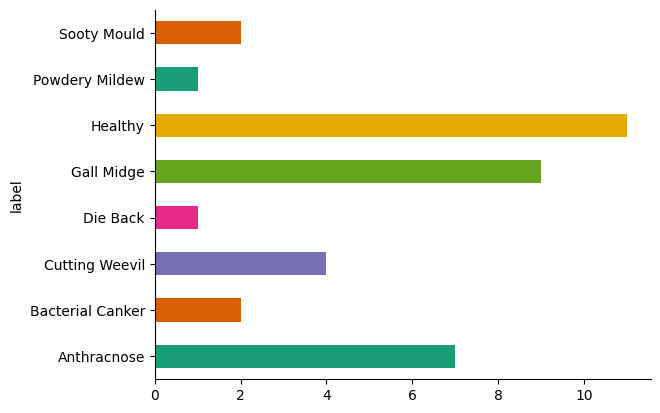

In [219]:
# @title label

from matplotlib import pyplot as plt
import seaborn as sns
custom_images_predictions_csv.groupby('label').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

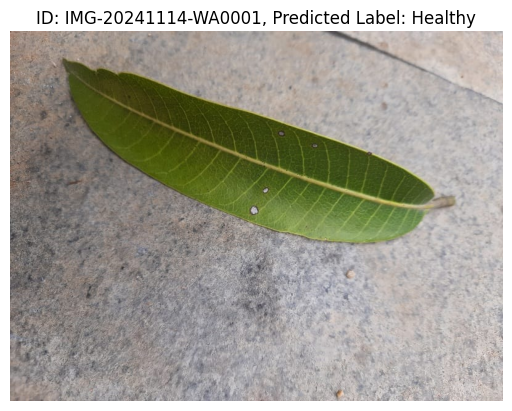

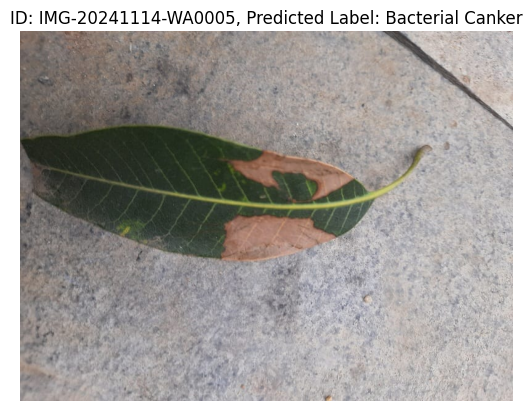

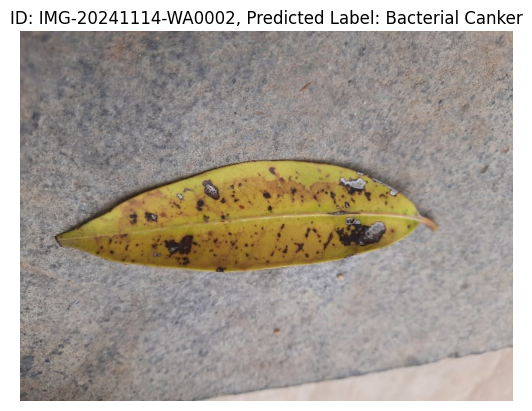

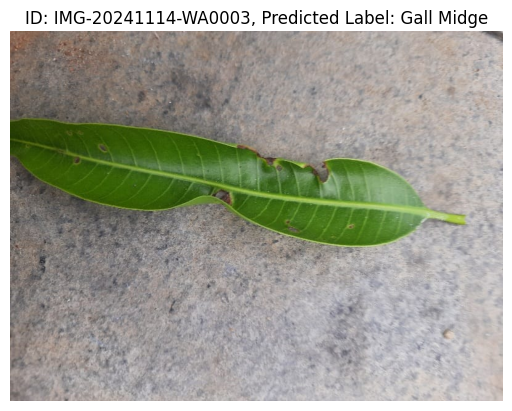

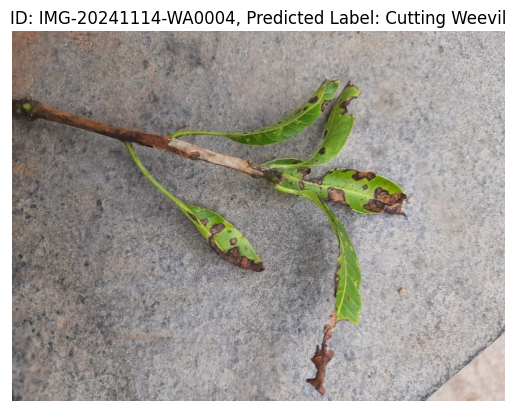

...

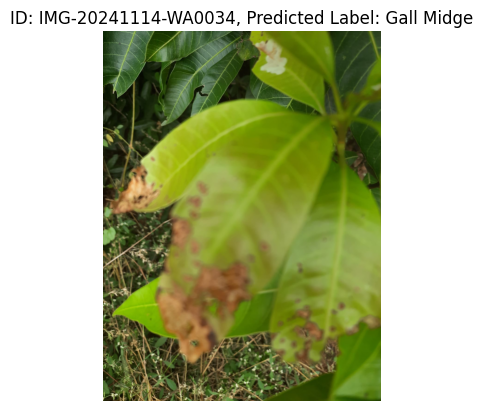

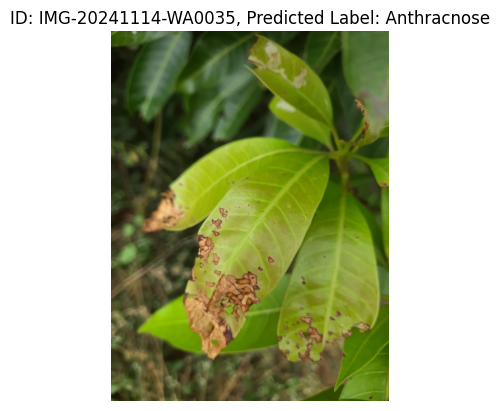

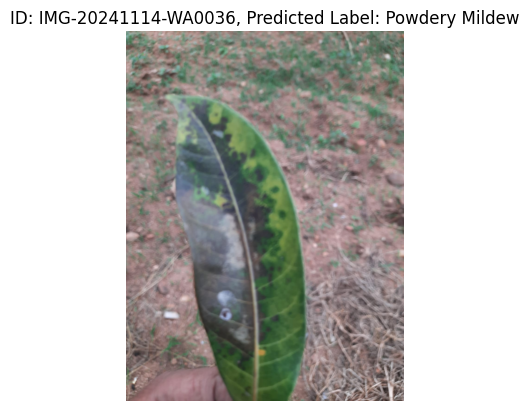

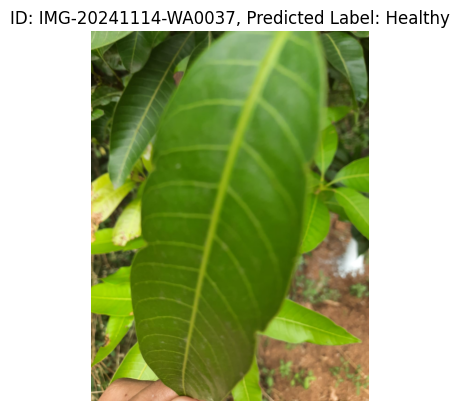

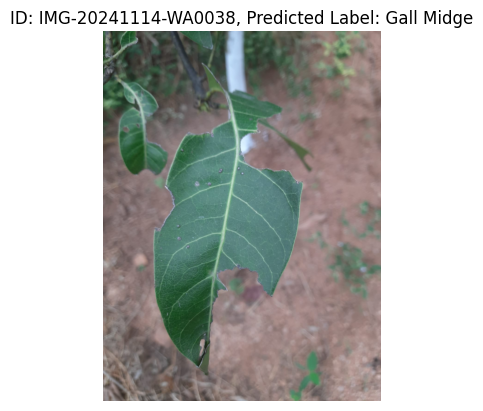

In [220]:
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
import os

# Assuming 'custom_images_predictions_csv' is your DataFrame
# and it has columns 'id' (image filename or path) and 'label'

for index, row in custom_images_predictions_csv.iterrows():
    image_id = row['id']  # Get the image ID from the 'id' column
    predicted_label = row['label']  # Get the predicted label from the 'label' column

    # Construct the full image path if 'id' contains only the filename
    image_path = os.path.join("/content/drive/MyDrive/mango leaf/images", image_id + ".jpg")  # Adjust ".jpg" if necessary

    try:
        image = Image.open(image_path)  # Open the image

        plt.imshow(image)  # Display the image
        plt.title(f"ID: {image_id}, Predicted Label: {predicted_label}")  # Set the title with ID and label
        plt.axis('off')  # Hide axes
        plt.show()  # Show the plot

    except FileNotFoundError:
        print(f"Image file not found: {image_path}")
    except Exception as e:
        print(f"Error displaying image {image_id}: {e}")

In [221]:
#instead of ececuting each and every line by line lets write a function that directly takes images return the predicted label
import os
import numpy as np
from tensorflow.keras.preprocessing import image

# Assuming these are globally defined or imported from your existing code
# distinct_disease_names = [...]  # List of class labels for predictions
# fully_loaded_model = ...  # Your pre-loaded model

def predict_image_label(image_path, model, distinct_disease_names):
    """
    Predicts the label for a single image.

    Parameters:
    - image_path (str): Path to the image file.
    - model: The pre-trained model for predictions.
    - distinct_disease_names (list): List of label names for classification.

    Returns:
    - str: Predicted label.
    """
    # Load and preprocess the image
    img = image.load_img(image_path, target_size=(224, 224))  # Adjust target size to match your model's input
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize if necessary

    # Make a prediction
    predictions = model.predict(img_array)

    # Get the predicted label
    predicted_label = distinct_disease_names[np.argmax(predictions)]

    return predicted_label

# Example usage
# image_path = input("Enter the path to the image: ")
# label = predict_image_label(image_path, fully_loaded_model, distinct_disease_names)
# print("Predicted Label:", label)


In [242]:
image_path = input("Enter the path to the image: ")
label = predict_image_label(image_path, fully_loaded_model, distinct_disease_names)
print("Predicted Label:", label)


Enter the path to the image: https://www.shutterstock.com/image-photo/anthracnose-disease-on-mango-leaf-260nw-1946321845.jpg
1/1 [==============================] - 0s 27ms/step
Predicted Label: Anthracnose


In [243]:
image_path

'https://www.shutterstock.com/image-photo/anthracnose-disease-on-mango-leaf-260nw-1946321845.jpg'

In [244]:
import requests
from PIL import Image
import io
import numpy as np
from tensorflow.keras.preprocessing import image
import tensorflow as tf

# Assume fully_loaded_model and distinct_disease_names are already defined

def predict_image_label(image_path, model, disease_names):
    # Check if image_path is a URL or a local file
    if image_path.startswith("http://") or image_path.startswith("https://"):
        # It's an online image, so download it
        response = requests.get(image_path)
        img = Image.open(io.BytesIO(response.content))
    else:
        # It's a local file, so just open it directly
        img = Image.open(image_path)

    # Preprocess image (resize, normalize)
    img = img.resize((224, 224))  # Resize to match model input size
    img_array = np.array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize the image

    # Make prediction
    predictions = model.predict(img_array)
    predicted_label = disease_names[np.argmax(predictions)]  # Get the label with max probability
    return predicted_label




In [247]:
# Input image path (local path or URL)
image_path = input("Enter the path to the image (local path or URL): ")

# Predict the label
label = predict_image_label(image_path, fully_loaded_model, distinct_disease_names)
print("Predicted Label:", label)

Enter the path to the image (local path or URL): https://source.roboflow.com/6B8bZtjrl1M2t1wG9nIzsUd1kgT2/0pFgBQZZZsJylpKEP8pW/thumb.jpg
1/1 [==============================] - 0s 25ms/step
Predicted Label: Sooty Mould


In [248]:
# Input image path (local path or URL)
image_path = input("Enter the path to the image (local path or URL): ")

# Predict the label
label = predict_image_label(image_path, fully_loaded_model, distinct_disease_names)
print("Predicted Label:", label)

Enter the path to the image (local path or URL): https://media.istockphoto.com/id/1494460969/photo/anthracnose-disease-on-mango-leaf-caused-by-colletotrichum-gloeosporioides-on-white-background.jpg?s=612x612&w=0&k=20&c=3ZwqxZwfdxxEWGgXJdB0oS197XwDorUocmscVymDYYA=
1/1 [==============================] - 0s 27ms/step
Predicted Label: Anthracnose


In [249]:
# Input image path (local path or URL)
image_path = input("Enter the path to the image (local path or URL): ")

# Predict the label
label = predict_image_label(image_path, fully_loaded_model, distinct_disease_names)
print("Predicted Label:", label)

Enter the path to the image (local path or URL): https://media.istockphoto.com/id/1281931947/photo/mango-tree-leaves.jpg?s=612x612&w=0&k=20&c=O0x3nlfWgLn01HjLyXJvbmQBpL2V-F7yCFuXvavhCiI=
1/1 [==============================] - 0s 24ms/step
Predicted Label: Healthy
